In [ ]:
import numpy as np
import pandas as pd
from sklearn.preprocessing import StandardScaler
import matplotlib.pyplot as plt
import seaborn as sns

# this is the code for the LSTM methodology.

building the data so LSTM can interpret

In [ ]:
# gather data

df = pd.read_csv("carbon_trading_dataset.csv")
df['Date'] = pd.to_datetime(df['Date'], format='%m/%d/%y')
df = df.sort_values(by='Date')

relevant_cols = [
    "Energy_Demand_MWh", "Emission_Produced_tCO2", "Emission_Allowance_tCO2",
    "Carbon_Price_USD_per_t", "Credits_Traded_tCO2",
    "Compliance_Cost_USD", "Carbon_Cost_Savings_USD"
]
n_timesteps = len(df)
n_features = len(relevant_cols)

# log transform everything
df_relevant = df[relevant_cols]
for col in relevant_cols:
    df_relevant[col] = np.log1p(df_relevant[col])

# standardize everything
scaler = StandardScaler()
data_scaled = scaler.fit_transform(df_relevant)
display_data_scaled = pd.DataFrame(data_scaled, columns=relevant_cols)
display_data_scaled

/tmp/ipython-input-1442867180.py:18: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df_relevant[col] = np.log1p(df_relevant[col])


,Energy_Demand_MWh,Emission_Produced_tCO2,Emission_Allowance_tCO2,Carbon_Price_USD_per_t,Credits_Traded_tCO2,Compliance_Cost_USD,Carbon_Cost_Savings_USD
0,0.186942,0.602017,0.593917,-1.207497,0.931329,-1.300266,0.549595
1,0.615175,0.303066,0.266525,0.849105,-1.422774,-0.184484,-1.170568
2,-1.881073,-2.508893,-1.960549,0.015446,-0.992292,1.207379,1.080362
3,-0.839797,-1.255004,-0.873913,1.313287,0.663837,-0.109989,1.047093
4,1.245952,1.002982,0.832667,0.810579,-1.942959,-0.590781,1.092710
...,...,...,...,...,...,...,...
4995,-1.323101,-0.817209,-1.359871,-0.636805,-0.136425,0.528550,-0.984099
4996,-0.375576,-0.576986,-0.035262,1.504328,-0.079638,-1.090553,-0.248339
4997,0.877612,0.073428,-0.188025,0.939451,1.050884,-1.251217,1.116182
4998,1.105619,1.139989,0.952021,0.593451,1.107671,-1.356411,0.859919


In [ ]:
##
## this is the LSTM time-series format for data - done
##

sequences = []
timestamps = []

# some hyperparameter type things
window_size = 30
stride = 1

for i in range(n_timesteps - window_size + 1):
    sequences.append(data_scaled[i:i+window_size])
    timestamps.append(df['Date'][i+window_size-1]) # last timestamp in window

X = np.array(sequences)
timestamps = np.array(timestamps)

for i, sample in enumerate(X[:3]): # testing first 3 samples
    print(f"\nSample {i}:")
    print(sample)


Sample 0:
[[ 0.18694208  0.60201667  0.59391744 -1.20749686  0.93132895 -1.30026578
   0.54959532]
 [ 0.61517511  0.30306562  0.26652463  0.84910536 -1.42277441 -0.18448441
  -1.1705681 ]
 [-1.88107314 -2.50889269 -1.96054872  0.0154457  -0.99229175  1.20737946
   1.08036221]
 [-0.83979718 -1.25500371 -0.87391252  1.31328679  0.66383739 -0.10998925
   1.04709273]
 [ 1.24595188  1.00298171  0.83266651  0.81057916 -1.94295947 -0.59078105
   1.09271013]
 [ 1.1266542   0.89373169  1.00700586  0.83493806  0.27253821 -1.33214352
  -0.40422674]
 [-0.90334049 -0.10924129 -0.0832768   1.49152135 -0.36240694 -1.87014363
  -1.13231874]
 [-0.91859609 -0.80251281 -0.89595751 -1.79055259 -1.12412021  0.7455017
  -1.42990933]
 [ 0.09884044 -0.62796273 -0.45084693  1.40858228 -1.50634828 -0.32092588
   0.18893433]
 [-0.0747201  -0.6449977  -0.24669119  0.18558269 -2.45425545  0.8208698
   1.07639029]
 [ 0.47299606  0.05034786  0.2880516   0.79632752  0.63954018 -0.32823015
   0.86456166]
 [ 0.1926396

train: 0 to 1000, test 1000 to 2000 - but also main model structure (oct 26)

In [ ]:
import numpy as np
import tensorflow as tf

# old imports
# from tensorflow.keras.models import Model
# from tensorflow.keras.layers import Input, LSTM, Dense, RepeatVector, TimeDistributed
# from tensorflow.keras.callbacks import EarlyStopping
# from tensorflow.keras.regularizers import l1, l2, l1_l2
# from tensorflow.keras.layers import Dropout

In [ ]:
# hyperparameters
latent_dim = 16
batch_size = 64
epochs = 50

In [ ]:
# this is the encoder step of the LSTM
inputs = Input(shape=(window_size, n_features))
encoded = LSTM(64, activation='relu', return_sequences=True, kernel_regularizer=l2(0.001))(inputs)
encoded = Dropout(0.2)(encoded)
encoded = LSTM(32, activation='relu', return_sequences=False, kernel_regularizer=l2(0.001))(encoded)
latent = Dense(latent_dim, activation='relu', kernel_regularizer=l2(0.001))(encoded)


In [ ]:
# this is the decoder step of the LSTM
decoded = RepeatVector(window_size)(latent)
decoded = LSTM(32, activation='relu', return_sequences=True, kernel_regularizer=l2(0.001))(decoded)
decoded = Dropout(0.2)(decoded)
decoded = LSTM(64, activation='relu', return_sequences=True, kernel_regularizer=l2(0.001))(decoded)
outputs = TimeDistributed(Dense(X.shape[2]))(decoded)


In [ ]:
# full model put together
autoencoder = Model(inputs, outputs)
autoencoder.compile(optimizer='adam', loss='mse')
autoencoder.summary()

Model: "functional"

┏━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━┓
┃ Layer (type)                    ┃ Output Shape           ┃       Param # ┃
┡━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━┩
│ input_layer (InputLayer)        │ (None, 30, 7)          │             0 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ lstm (LSTM)                     │ (None, 30, 64)         │        18,432 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dropout (Dropout)               │ (None, 30, 64)         │             0 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ lstm_1 (LSTM)                   │ (None, 32)             │        12,416 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense (Dense)                   │ (None, 16)             │           528 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ repeat_vector (RepeatVector)    │ (None, 30, 16)         │             0 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ lstm_2 (LSTM)                   │ (None, 30, 32)         │         6,272 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dropout_1 (Dropout)             │ (None, 30, 32)         │             0 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ lstm_3 (LSTM)                   │ (None, 30, 64)         │        24,832 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ time_distributed                │ (None, 30, 7)          │           455 │
│ (TimeDistributed)               │                        │               │
└─────────────────────────────────┴────────────────────────┴───────────────┘

 Total params: 62,935 (245.84 KB)

 Trainable params: 62,935 (245.84 KB)

 Non-trainable params: 0 (0.00 B)

In [ ]:
##
## early stopping to control num epochs

es = EarlyStopping(monitor='val_loss', patience=10, restore_best_weights=True)

history = autoencoder.fit(
    X[:1000], X[:1000],
    epochs=epochs,
    batch_size=batch_size,
    validation_split=0.2,
    callbacks=[es]
)

Epoch 1/50
13/13 ━━━━━━━━━━━━━━━━━━━━ 12s 183ms/step - loss: 1.2055 - val_loss: 1.2062
Epoch 2/50
13/13 ━━━━━━━━━━━━━━━━━━━━ 1s 85ms/step - loss: 1.1554 - val_loss: 1.1715
Epoch 3/50
13/13 ━━━━━━━━━━━━━━━━━━━━ 1s 93ms/step - loss: 1.1232 - val_loss: 1.1449
Epoch 4/50
13/13 ━━━━━━━━━━━━━━━━━━━━ 1s 98ms/step - loss: 1.0986 - val_loss: 1.1231
Epoch 5/50
13/13 ━━━━━━━━━━━━━━━━━━━━ 2s 158ms/step - loss: 1.0737 - val_loss: 1.1055
Epoch 6/50
13/13 ━━━━━━━━━━━━━━━━━━━━ 1s 96ms/step - loss: 1.0578 - val_loss: 1.0918
Epoch 7/50
13/13 ━━━━━━━━━━━━━━━━━━━━ 1s 81ms/step - loss: 1.0485 - val_loss: 1.0842
Epoch 8/50
13/13 ━━━━━━━━━━━━━━━━━━━━ 1s 81ms/step - loss: 1.0513 - val_loss: 1.0788
Epoch 9/50
13/13 ━━━━━━━━━━━━━━━━━━━━ 1s 90ms/step - loss: 1.0401 - val_loss: 1.0738
Epoch 10/50
13/13 ━━━━━━━━━━━━━━━━━━━━ 1s 91ms/step - loss: 1.0385 - val_loss: 1.0702
Epoch 11/50
13/13 ━━━━━━━━━━━━━━━━━━━━ 1s 83ms/step - loss: 1.0279 - val_loss: 1.0669
Epoch 12/50
13/13 ━━━━━━━━━━━━━━━━━━━━ 1s 90ms/step - loss: 

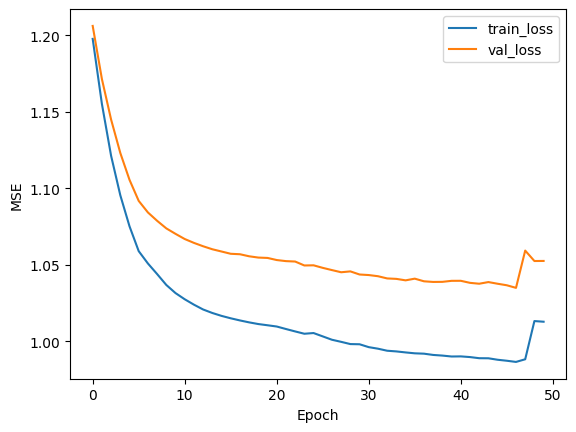

In [ ]:
plt.plot(history.history['loss'], label='train_loss')
plt.plot(history.history['val_loss'], label='val_loss')
plt.xlabel('Epoch')
plt.ylabel('MSE')
plt.legend()
plt.show()

##
## important function
##
# averages all the point errors across all windows for that point - this
def aggregate_point_errors(window_errors):
  num_points = len(window_errors) + window_size - 1
  point_errors = np.zeros(num_points)
  counts = np.zeros(num_points)
  for w_idx in range(len(window_errors)):
      for t in range(window_size):
          global_idx = w_idx + t
          point_errors[global_idx] += window_errors[w_idx, t]
          counts[global_idx] += 1
  return point_errors / counts

In [ ]:
X_train = X[:1000]
X_test = X[1000:2000]

# predicting test set windows
X_pred = autoencoder.predict(X_test)
train_pred = autoencoder.predict(X_train)

# reconstruction errors per window
train_window_errors = np.mean((X_train - train_pred)**2, axis=2)
test_window_errors  = np.mean((X_test  - X_pred)**2, axis=2)

# reconstruction errors per transaction
point_errors_train = aggregate_point_errors(train_window_errors)
point_errors_test  = aggregate_point_errors(test_window_errors)

# threshold 99.5%ile business
threshold = np.percentile(point_errors_train, 99.5)
anomalous_train_points = np.where(point_errors_train > threshold)[0]
anomalous_test_points  = np.where(point_errors_test  > threshold)[0]

print(f"Iteration 1:")
print(f"  Training anomalies: {len(anomalous_train_points)} points")
print(f"  Indices (0-based): {anomalous_train_points}")
print(f"  Indices (1-based): {anomalous_train_points + 1}")
print(f"  Test anomalies: {len(anomalous_test_points)} points")
print(f"  Indices (0-based): {anomalous_test_points}")
print(f"  Indices (1-based): {anomalous_test_points + 1}")
print()

32/32 ━━━━━━━━━━━━━━━━━━━━ 1s 16ms/step
32/32 ━━━━━━━━━━━━━━━━━━━━ 0s 15ms/step
Iteration 1:
  Training anomalies: 6 points
  Indices (0-based): [ 46  91 559 704 928 987]
  Indices (1-based): [ 47  92 560 705 929 988]
  Test anomalies: 4 points
  Indices (0-based): [356 831 849 948]
  Indices (1-based): [357 832 850 949]



major pipeline starts here

In [ ]:
!pip3 install scikeras

In [ ]:
import numpy as np
import matplotlib.pyplot as plt

from tensorflow.keras.models import Model
from tensorflow.keras.layers import Input, LSTM, Dense, RepeatVector, TimeDistributed, Dropout
from tensorflow.keras.regularizers import l2
from tensorflow.keras.callbacks import EarlyStopping

from scikeras.wrappers import KerasRegressor
from sklearn.model_selection import GridSearchCV
from itertools import product

In [ ]:
# holy hyperparameter grid

##
## note: earlier was too ambitious thinking i could finetune a lot of hyperparams
##       decided to keep these as comments below to show how code evolved!
##

param_grid = {
    'latent_dim': [8, 16],
    'l2_reg': [0.01, 0.001],
    # 'dropout_rate': [0.2, 0.3],
    'batch_size': [32, 64],
    # 'epochs': [30, 50],
    # 'encoder_units_1': [32, 64, 128],
    # 'encoder_units_2': [16, 32, 64],
    # 'decoder_units_1': [16, 32, 64],
    # 'decoder_units_2': [32, 64, 128],
    'patience': [3, 5]
    # 'fit__validation_split': [0.2],
    # 'fit__callbacks': [
    #     [EarlyStopping(monitor='val_loss', patience=3, restore_best_weights=True, verbose=1)],
    #     [EarlyStopping(monitor='val_loss', patience=5, restore_best_weights=True, verbose=1)],
    #     [EarlyStopping(monitor='val_loss', patience=15, restore_best_weights=True, verbose=1)]
    # ]
}

In [ ]:
##
## this method is important: modular method for GridSearchCV process later down the line
##

def build_autoencoder(latent_dim=16, l2_reg=0.001, dropout_rate=0.2, encoder_units_1=64, encoder_units_2=32, decoder_units_1=32, decoder_units_2=64, patience=10):

    # encoder part
    inputs = Input(shape=(window_size, n_features))
    x = LSTM(encoder_units_1, activation='relu', return_sequences=True, kernel_regularizer=l2(l2_reg))(inputs)
    x = Dropout(dropout_rate)(x)
    x = LSTM(encoder_units_2, activation='relu', return_sequences=False, kernel_regularizer=l2(l2_reg))(x)
    latent = Dense(latent_dim, activation='relu', kernel_regularizer=l2(l2_reg))(x)

    # decoder part
    x = RepeatVector(window_size)(latent)
    x = LSTM(decoder_units_1, activation='relu', return_sequences=True, kernel_regularizer=l2(l2_reg))(x)
    x = Dropout(dropout_rate)(x)
    x = LSTM(decoder_units_2, activation='relu', return_sequences=True, kernel_regularizer=l2(l2_reg))(x)
    outputs = TimeDistributed(Dense(n_features))(x)

    model = Model(inputs, outputs)
    model.compile(optimizer='adam', loss='mse')
    return model


In [ ]:
# testing keras reg for modularity

keras_reg = KerasRegressor(
    model=build_autoencoder,
    epochs=30,
    batch_size=64,
    verbose=0
)

In [ ]:
grid = GridSearchCV(
    estimator=keras_reg,
    param_grid=param_grid,
    cv = 3,
    scoring='neg_mean_squared_error',
    verbose=2
)

train: 0 to 1000, test 1000 to 2000 - gridsearch cv (nov 1st)

In [ ]:
##
## this is the main pipeline using minimum algorithm to find best model for that expanding window split
##

best_loss = np.inf
best_params = None
best_model = None
best_history = None

for values in product(*param_grid.values()):
    params = dict(zip(param_grid.keys(), values))
    print("Training with params:", params)

    # important at build time
    model = build_autoencoder(
        latent_dim=params['latent_dim'],
        l2_reg=params['l2_reg'],
    )
    es = EarlyStopping(monitor='val_loss', patience=params['patience'], restore_best_weights=True, verbose=1)

    # train time
    history = model.fit(
        X[:1000], X[:1000],
        # epochs=params['epochs'], # no more doing epochs as hyperparam
        epochs = 40,
        batch_size=params['batch_size'],
        validation_split=0.2,
        callbacks=[es],
        verbose=0
    )

    val_loss = min(history.history['val_loss'])
    print(f"Val loss: {val_loss:.6f}\n")

    # minimum algorithm
    if val_loss < best_loss:
        best_loss = val_loss
        best_params = params
        best_model = model
        best_history = history.history

    ## save best model for anomaly detection (this is next step)


Training with params: {'latent_dim': 8, 'l2_reg': 0.01, 'batch_size': 32, 'patience': 3}
Epoch 19: early stopping
Restoring model weights from the end of the best epoch: 16.
Val loss: 1.044932

Training with params: {'latent_dim': 8, 'l2_reg': 0.01, 'batch_size': 32, 'patience': 5}
Epoch 32: early stopping
Restoring model weights from the end of the best epoch: 27.
Val loss: 1.039497

Training with params: {'latent_dim': 8, 'l2_reg': 0.01, 'batch_size': 64, 'patience': 3}
Restoring model weights from the end of the best epoch: 40.
Val loss: 1.060500

Training with params: {'latent_dim': 8, 'l2_reg': 0.01, 'batch_size': 64, 'patience': 5}
Epoch 36: early stopping
Restoring model weights from the end of the best epoch: 31.
Val loss: 1.043038

Training with params: {'latent_dim': 8, 'l2_reg': 0.001, 'batch_size': 32, 'patience': 3}
Epoch 40: early stopping
Restoring model weights from the end of the best epoch: 37.
Val loss: 1.029135

Training with params: {'latent_dim': 8, 'l2_reg': 0.00

In [ ]:
print("Best params:", best_params)
print("Best score (MSE):", best_loss)

Best params: {'latent_dim': 16, 'l2_reg': 0.001, 'batch_size': 32, 'patience': 3}
Best score (MSE): 1.016813039779663


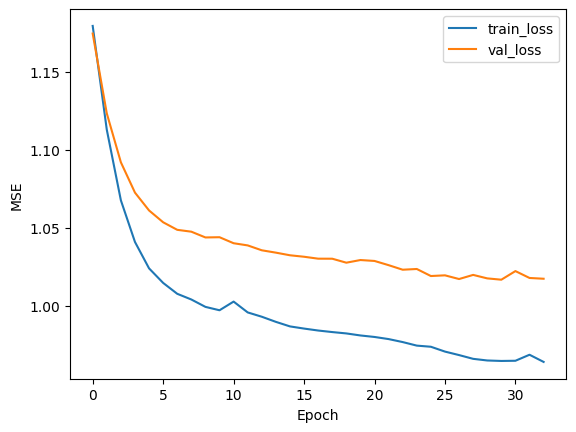

In [ ]:
# loss function graph

plt.plot(best_history['loss'], label='train_loss')
plt.plot(best_history['val_loss'], label='val_loss')
plt.xlabel('Epoch')
plt.ylabel('MSE')
plt.legend()
plt.show()

In [ ]:
# same method from above in this cell so i don't have to scroll up that often

def aggregate_point_errors(window_errors):
  num_points = len(window_errors) + window_size - 1
  point_errors = np.zeros(num_points)
  counts = np.zeros(num_points)
  for w_idx in range(len(window_errors)):
      for t in range(window_size):
          global_idx = w_idx + t
          point_errors[global_idx] += window_errors[w_idx, t]
          counts[global_idx] += 1
  return point_errors / counts

  ## this is the reconstruction error for anomaly detection at 99.5 in next cell

In [ ]:
X_train = X[:1000]
X_test  = X[1000:2000]

train_pred = best_model.predict(X_train)
X_pred = best_model.predict(X_test)

train_window_errors = np.mean((X_train - train_pred)**2, axis=2)
test_window_errors  = np.mean((X_test  - X_pred)**2, axis=2)

point_errors_train = aggregate_point_errors(train_window_errors)
point_errors_test  = aggregate_point_errors(test_window_errors)

threshold = np.percentile(point_errors_train, 99.5)
anomalous_train_points = np.where(point_errors_train > threshold)[0]
anomalous_test_points  = np.where(point_errors_test  > threshold)[0]

print(f"Iteration 1:")
print(f"  Training anomalies: {len(anomalous_train_points)} points")
print(f"  Indices (0-based): {anomalous_train_points}")
print(f"  Indices (1-based): {anomalous_train_points + 1}")
print(f"  Test anomalies: {len(anomalous_test_points)} points")
print(f"  Indices (0-based): {anomalous_test_points}")
print(f"  Indices (1-based): {anomalous_test_points + 1}")

32/32 ━━━━━━━━━━━━━━━━━━━━ 1s 39ms/step
32/32 ━━━━━━━━━━━━━━━━━━━━ 1s 38ms/step
Iteration 1:
  Training anomalies: 6 points
  Indices (0-based): [ 46  91 559 704 928 987]
  Indices (1-based): [ 47  92 560 705 929 988]
  Test anomalies: 4 points
  Indices (0-based): [356 831 849 948]
  Indices (1-based): [357 832 850 949]


In [ ]:
plt.plot(point_errors_train, label='Train point errors')
plt.plot(point_errors_test, label='Test point errors')
plt.axhline(threshold, color='r', linestyle='--', label='Threshold (99.5%)')
plt.legend()
plt.xlabel('Time point')
plt.ylabel('Reconstruction error')
plt.title('Anomaly detection per point')
plt.show()

train: 0 to 2000, test 2000 to 3000 - gridsearch cv (nov 1st)

In [ ]:
best_loss = np.inf
best_params = None
best_model = None
best_history = None

for values in product(*param_grid.values()):
    params = dict(zip(param_grid.keys(), values))
    print("Training with params:", params)

    # important at build time
    model = build_autoencoder(
        latent_dim=params['latent_dim'],
        l2_reg=params['l2_reg'],
        # dropout_rate=params['dropout_rate'],
    )
    es = EarlyStopping(monitor='val_loss', patience=params['patience'], restore_best_weights=True, verbose=1)

    # important at train time
    history = model.fit(
        X[:2000], X[:2000],
        # epochs=params['epochs'], # no
        epochs = 40,
        batch_size=params['batch_size'],
        validation_split=0.2,
        callbacks=[es],
        verbose=0
    )

    val_loss = min(history.history['val_loss'])
    print(f"Val loss: {val_loss:.6f}\n")

    if val_loss < best_loss:
        best_loss = val_loss
        best_params = params
        best_model = model
        best_history = history.history


Training with params: {'latent_dim': 8, 'l2_reg': 0.01, 'batch_size': 32, 'patience': 3}
Epoch 23: early stopping
Restoring model weights from the end of the best epoch: 20.
Val loss: 0.998574

Training with params: {'latent_dim': 8, 'l2_reg': 0.01, 'batch_size': 32, 'patience': 5}
Restoring model weights from the end of the best epoch: 40.
Val loss: 0.998526

Training with params: {'latent_dim': 8, 'l2_reg': 0.01, 'batch_size': 64, 'patience': 3}
Epoch 15: early stopping
Restoring model weights from the end of the best epoch: 12.
Val loss: 1.002062

Training with params: {'latent_dim': 8, 'l2_reg': 0.01, 'batch_size': 64, 'patience': 5}
Restoring model weights from the end of the best epoch: 37.
Val loss: 0.984557

Training with params: {'latent_dim': 8, 'l2_reg': 0.001, 'batch_size': 32, 'patience': 3}
Epoch 10: early stopping
Restoring model weights from the end of the best epoch: 7.
Val loss: 0.989153

Training with params: {'latent_dim': 8, 'l2_reg': 0.001, 'batch_size': 32, 'pati

In [ ]:
print("Best params:", best_params)
print("Best score (MSE):", best_loss)

Best params: {'latent_dim': 8, 'l2_reg': 0.001, 'batch_size': 32, 'patience': 5}
Best score (MSE): 0.9650875329971313


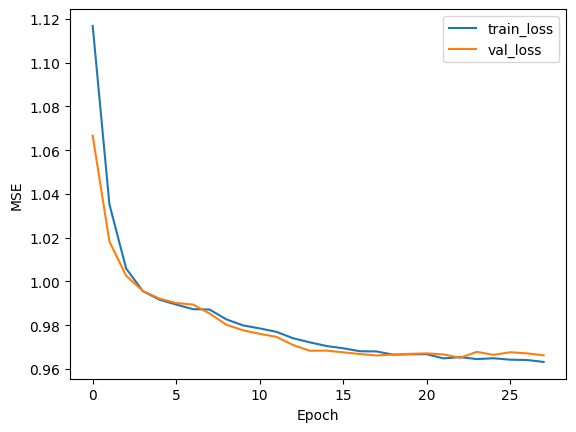

In [ ]:
plt.plot(best_history['loss'], label='train_loss')
plt.plot(best_history['val_loss'], label='val_loss')
plt.xlabel('Epoch')
plt.ylabel('MSE')
plt.legend()
plt.show()

In [ ]:
def aggregate_point_errors(window_errors):
  num_points = len(window_errors) + window_size - 1
  point_errors = np.zeros(num_points)
  counts = np.zeros(num_points)
  for w_idx in range(len(window_errors)):
      for t in range(window_size):
          global_idx = w_idx + t
          point_errors[global_idx] += window_errors[w_idx, t]
          counts[global_idx] += 1
  return point_errors / counts

In [ ]:
X_train = X[:2000]
X_test  = X[2000:3000]

train_pred = best_model.predict(X_train)
X_pred = best_model.predict(X_test)

train_window_errors = np.mean((X_train - train_pred)**2, axis=2)
test_window_errors  = np.mean((X_test  - X_pred)**2, axis=2)

point_errors_train = aggregate_point_errors(train_window_errors)
point_errors_test  = aggregate_point_errors(test_window_errors)

threshold = np.percentile(point_errors_train, 99.5)
anomalous_train_points = np.where(point_errors_train > threshold)[0]
anomalous_test_points  = np.where(point_errors_test  > threshold)[0]

print(f"Iteration 1:")
print(f"  Training anomalies: {len(anomalous_train_points)} points")
print(f"  Indices (0-based): {anomalous_train_points}")
print(f"  Indices (1-based): {anomalous_train_points + 1}")
print(f"  Test anomalies: {len(anomalous_test_points)} points")
print(f"  Indices (0-based): {anomalous_test_points + 2000}")
print(f"  Indices (1-based): {anomalous_test_points + 2001}")

63/63 ━━━━━━━━━━━━━━━━━━━━ 1s 19ms/step
32/32 ━━━━━━━━━━━━━━━━━━━━ 1s 20ms/step
Iteration 1:
  Training anomalies: 11 points
  Indices (0-based): [  46   91  559  704  928  987 1356 1523 1831 1849 1948]
  Indices (1-based): [  47   92  560  705  929  988 1357 1524 1832 1850 1949]
  Test anomalies: 6 points
  Indices (0-based): [2166 2183 2207 2547 2690 2961]
  Indices (1-based): [2167 2184 2208 2548 2691 2962]


train: 0 to 3000, test 3000 to 4000 - gridsearch cv (nov 1st)

In [ ]:
best_loss = np.inf
best_params = None
best_model = None
best_history = None

for values in product(*param_grid.values()):
    params = dict(zip(param_grid.keys(), values))
    print("Training with params:", params)

    # build
    model = build_autoencoder(
        latent_dim=params['latent_dim'],
        l2_reg=params['l2_reg'],
    )
    es = EarlyStopping(monitor='val_loss', patience=params['patience'], restore_best_weights=True, verbose=1)

    # train
    history = model.fit(
        X[:3000], X[:3000],
        # epochs=params['epochs'], # no
        epochs = 40,
        batch_size=params['batch_size'],
        validation_split=0.2,
        callbacks=[es],
        verbose=0
    )

    val_loss = min(history.history['val_loss'])
    print(f"Val loss: {val_loss:.6f}\n")

    if val_loss < best_loss:
        best_loss = val_loss
        best_params = params
        best_model = model
        best_history = history.history


Training with params: {'latent_dim': 8, 'l2_reg': 0.01, 'batch_size': 32, 'patience': 3}
Epoch 7: early stopping
Restoring model weights from the end of the best epoch: 4.
Val loss: 1.009159

Training with params: {'latent_dim': 8, 'l2_reg': 0.01, 'batch_size': 32, 'patience': 5}
Restoring model weights from the end of the best epoch: 39.
Val loss: 1.004174

Training with params: {'latent_dim': 8, 'l2_reg': 0.01, 'batch_size': 64, 'patience': 3}
Epoch 20: early stopping
Restoring model weights from the end of the best epoch: 17.
Val loss: 1.006656

Training with params: {'latent_dim': 8, 'l2_reg': 0.01, 'batch_size': 64, 'patience': 5}
Restoring model weights from the end of the best epoch: 40.
Val loss: 1.262790

Training with params: {'latent_dim': 8, 'l2_reg': 0.001, 'batch_size': 32, 'patience': 3}
Epoch 31: early stopping
Restoring model weights from the end of the best epoch: 28.
Val loss: 0.995855

Training with params: {'latent_dim': 8, 'l2_reg': 0.001, 'batch_size': 32, 'patie

In [ ]:
print("Best params:", best_params)
print("Best score (MSE):", best_loss)

Best params: {'latent_dim': 16, 'l2_reg': 0.001, 'batch_size': 64, 'patience': 3}
Best score (MSE): 0.9727559685707092


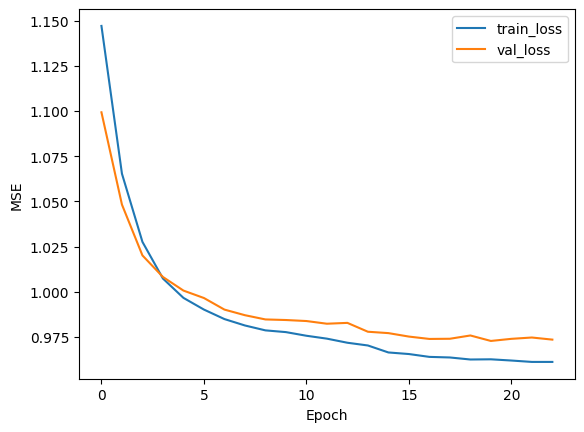

In [ ]:
plt.plot(best_history['loss'], label='train_loss')
plt.plot(best_history['val_loss'], label='val_loss')
plt.xlabel('Epoch')
plt.ylabel('MSE')
plt.legend()
plt.show()

In [ ]:
def aggregate_point_errors(window_errors):
  num_points = len(window_errors) + window_size - 1
  point_errors = np.zeros(num_points)
  counts = np.zeros(num_points)
  for w_idx in range(len(window_errors)):
      for t in range(window_size):
          global_idx = w_idx + t
          point_errors[global_idx] += window_errors[w_idx, t]
          counts[global_idx] += 1
  return point_errors / counts

In [ ]:
X_train = X[:3000]
X_test  = X[3000:4000]

train_pred = best_model.predict(X_train)
X_pred = best_model.predict(X_test)

train_window_errors = np.mean((X_train - train_pred)**2, axis=2)
test_window_errors  = np.mean((X_test  - X_pred)**2, axis=2)

point_errors_train = aggregate_point_errors(train_window_errors)
point_errors_test  = aggregate_point_errors(test_window_errors)

threshold = np.percentile(point_errors_train, 99.5)
anomalous_train_points = np.where(point_errors_train > threshold)[0]
anomalous_test_points  = np.where(point_errors_test  > threshold)[0]

print(f"Iteration 1:")
print(f"  Training anomalies: {len(anomalous_train_points)} points")
print(f"  Indices (0-based): {anomalous_train_points}")
print(f"  Indices (1-based): {anomalous_train_points + 1}")
print(f"  Test anomalies: {len(anomalous_test_points)} points")
print(f"  Indices (0-based): {anomalous_test_points + 3000}")
print(f"  Indices (1-based): {anomalous_test_points + 3001}")

94/94 ━━━━━━━━━━━━━━━━━━━━ 4s 26ms/step
32/32 ━━━━━━━━━━━━━━━━━━━━ 0s 14ms/step
Iteration 1:
  Training anomalies: 16 points
  Indices (0-based): [  46   91  286  559  704  928  987 1356 1831 1849 1948 2166 2183 2207
 2547 2961]
  Indices (1-based): [  47   92  287  560  705  929  988 1357 1832 1850 1949 2167 2184 2208
 2548 2962]
  Test anomalies: 1 points
  Indices (0-based): [3048]
  Indices (1-based): [3049]


train: 0 to 4000, test 4000 to 5000 - gridsearch cv (nov 1st)

In [ ]:
best_loss = np.inf
best_params = None
best_model = None
best_history = None

for values in product(*param_grid.values()):
    params = dict(zip(param_grid.keys(), values))
    print("Training with params:", params)

    # build
    model = build_autoencoder(
        latent_dim=params['latent_dim'],
        l2_reg=params['l2_reg'],
    )
    es = EarlyStopping(monitor='val_loss', patience=params['patience'], restore_best_weights=True, verbose=1)

    # train
    history = model.fit(
        X[:4000], X[:4000],
        # epochs=params['epochs'], # no
        epochs = 40,
        batch_size=params['batch_size'],
        validation_split=0.2,
        callbacks=[es],
        verbose=0
    )

    val_loss = min(history.history['val_loss'])
    print(f"Val loss: {val_loss:.6f}\n")

    if val_loss < best_loss:
        best_loss = val_loss
        best_params = params
        best_model = model
        best_history = history.history


Training with params: {'latent_dim': 8, 'l2_reg': 0.01, 'batch_size': 32, 'patience': 3}
Epoch 24: early stopping
Restoring model weights from the end of the best epoch: 21.
Val loss: 0.959622

Training with params: {'latent_dim': 8, 'l2_reg': 0.01, 'batch_size': 32, 'patience': 5}
Epoch 11: early stopping
Restoring model weights from the end of the best epoch: 6.
Val loss: 0.959824

Training with params: {'latent_dim': 8, 'l2_reg': 0.01, 'batch_size': 64, 'patience': 3}
Epoch 23: early stopping
Restoring model weights from the end of the best epoch: 20.
Val loss: 0.957000

Training with params: {'latent_dim': 8, 'l2_reg': 0.01, 'batch_size': 64, 'patience': 5}
Epoch 37: early stopping
Restoring model weights from the end of the best epoch: 32.
Val loss: 0.986464

Training with params: {'latent_dim': 8, 'l2_reg': 0.001, 'batch_size': 32, 'patience': 3}
Epoch 14: early stopping
Restoring model weights from the end of the best epoch: 11.
Val loss: 0.952451

Training with params: {'latent

In [ ]:
print("Best params:", best_params)
print("Best score (MSE):", best_loss)

Best params: {'latent_dim': 16, 'l2_reg': 0.001, 'batch_size': 32, 'patience': 5}
Best score (MSE): 0.8982309699058533


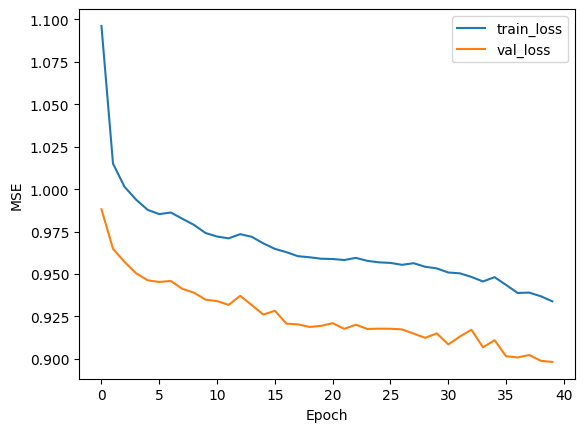

In [ ]:
plt.plot(best_history['loss'], label='train_loss')
plt.plot(best_history['val_loss'], label='val_loss')
plt.xlabel('Epoch')
plt.ylabel('MSE')
plt.legend()
plt.show()

In [ ]:
# bascially for each window that an index exists, it accumulates the reconstruction error

def aggregate_point_errors(window_errors):
  num_points = len(window_errors) + window_size - 1
  point_errors = np.zeros(num_points)
  counts = np.zeros(num_points)
  for w_idx in range(len(window_errors)):
      for t in range(window_size):
          global_idx = w_idx + t
          point_errors[global_idx] += window_errors[w_idx, t]
          counts[global_idx] += 1
  return point_errors / counts

In [ ]:
X_train = X[:4000]
X_test  = X[4000:5000]

train_pred = best_model.predict(X_train)
X_pred = best_model.predict(X_test)

train_window_errors = np.mean((X_train - train_pred)**2, axis=2)
test_window_errors  = np.mean((X_test  - X_pred)**2, axis=2)

point_errors_train = aggregate_point_errors(train_window_errors)
point_errors_test  = aggregate_point_errors(test_window_errors)

threshold = np.percentile(point_errors_train, 99.5)
anomalous_train_points = np.where(point_errors_train > threshold)[0]
anomalous_test_points  = np.where(point_errors_test  > threshold)[0]

print(f"Iteration 1:")
print(f"  Training anomalies: {len(anomalous_train_points)} points")
print(f"  Indices (0-based): {anomalous_train_points}")
print(f"  Indices (1-based): {anomalous_train_points + 1}")
print(f"  Test anomalies: {len(anomalous_test_points)} points")
print(f"  Indices (0-based): {anomalous_test_points + 4000}")
print(f"  Indices (1-based): {anomalous_test_points + 4001}")

125/125 ━━━━━━━━━━━━━━━━━━━━ 2s 12ms/step
31/31 ━━━━━━━━━━━━━━━━━━━━ 1s 42ms/step
Iteration 1:
  Training anomalies: 21 points
  Indices (0-based): [  46   86   91  173  586  636  928 1269 1675 1948 1985 2186 2311 2547
 2690 2873 2961 2976 3048 3247 3634]
  Indices (1-based): [  47   87   92  174  587  637  929 1270 1676 1949 1986 2187 2312 2548
 2691 2874 2962 2977 3049 3248 3635]
  Test anomalies: 10 points
  Indices (0-based): [4174 4175 4215 4355 4371 4466 4528 4697 4772 4898]
  Indices (1-based): [4175 4176 4216 4356 4372 4467 4529 4698 4773 4899]


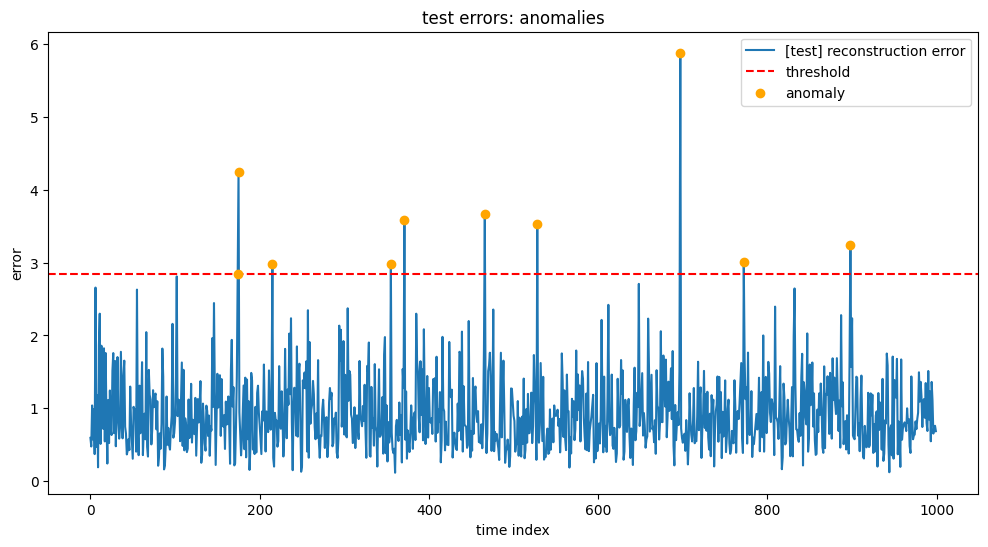

In [ ]:
# scattering for visualize, this could be good graph

plt.figure(figsize=(12,6))
plt.plot(point_errors_test, label='[test] reconstruction error')
plt.axhline(threshold, color='red', linestyle='--', label='threshold')

plt.scatter(anomalous_test_points, point_errors_test[anomalous_test_points],
            color='orange', label='anomaly', zorder=5)

plt.xlabel('time index')
plt.ylabel('error')
plt.title('test errors: anomalies')
plt.legend()
plt.show()

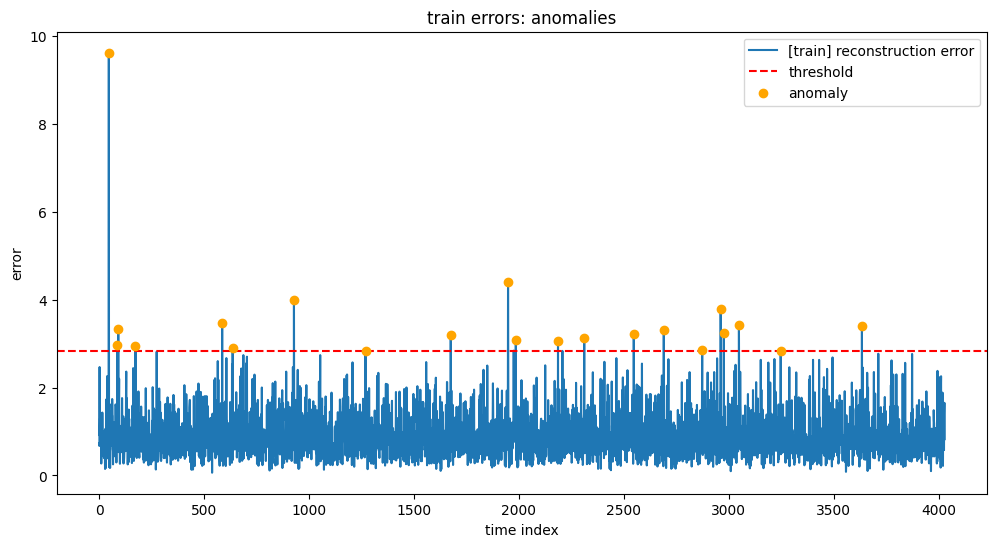

In [ ]:
# scattering for visualization, could be good graph

plt.figure(figsize=(12,6))
plt.plot(point_errors_train, label='[train] reconstruction error')
plt.axhline(threshold, color='red', linestyle='--', label='threshold')

plt.scatter(anomalous_train_points, point_errors_train[anomalous_train_points],
            color='orange', label='anomaly', zorder=5)

plt.xlabel('time index')
plt.ylabel('error')
plt.title('train errors: anomalies')
plt.legend()
plt.show()

Anomaly window 46: plotting from 36 to 57


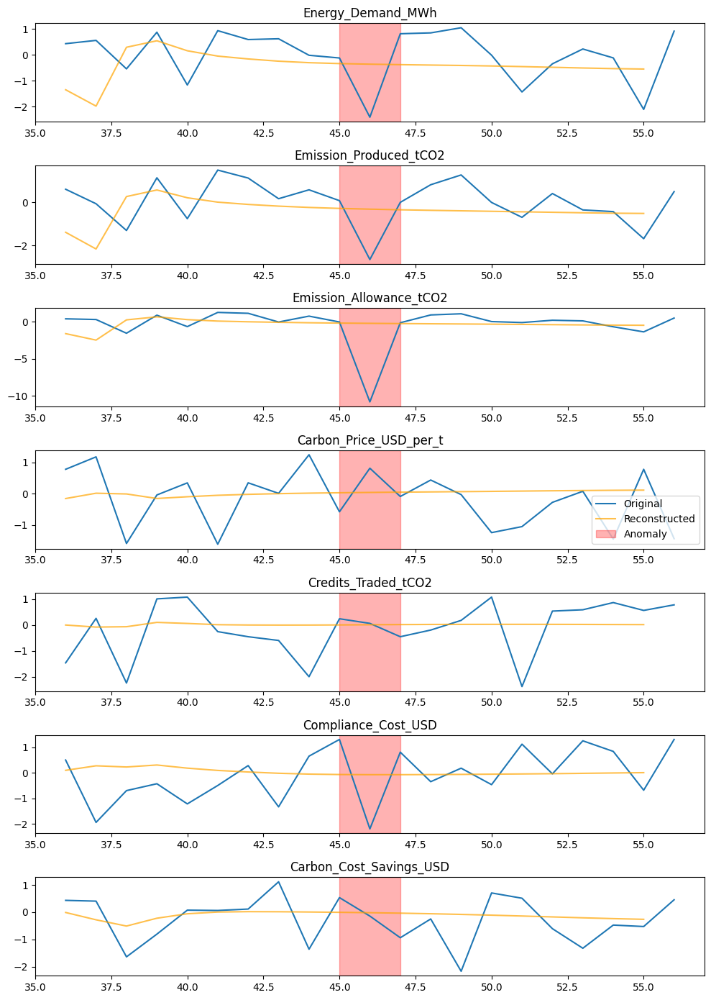

Anomaly window 86: plotting from 76 to 97


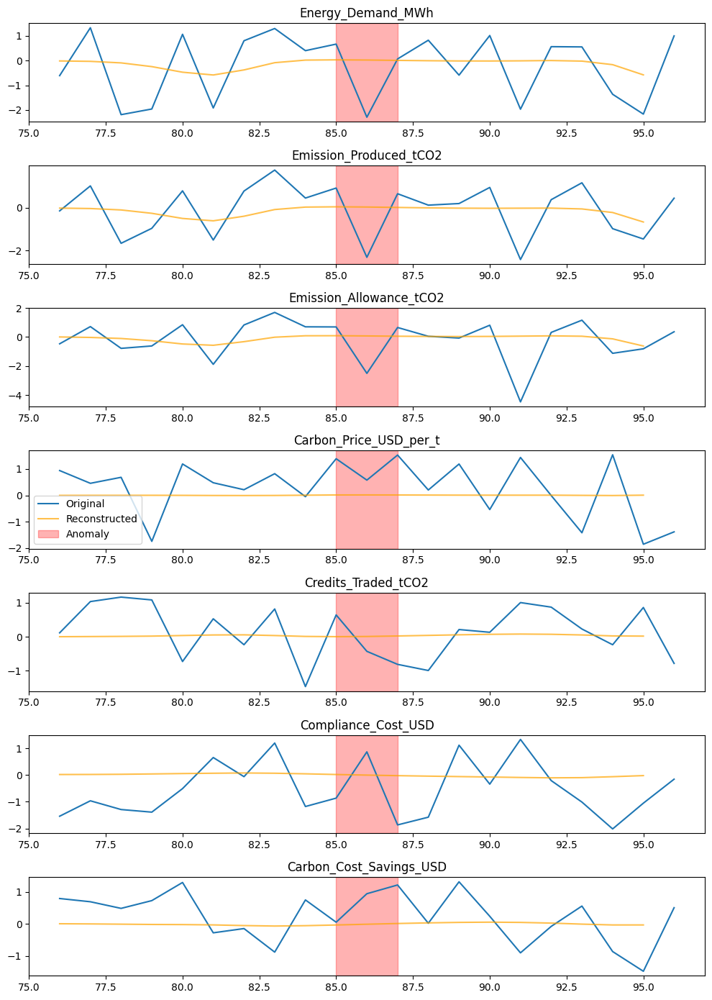

Anomaly window 91: plotting from 81 to 102


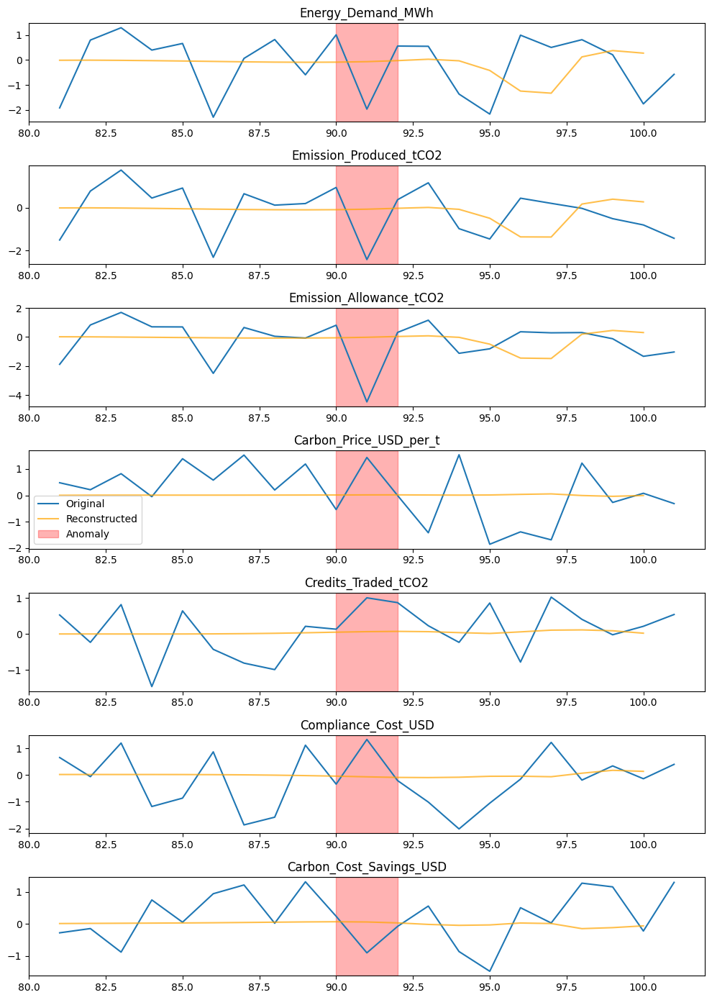

Anomaly window 173: plotting from 163 to 184


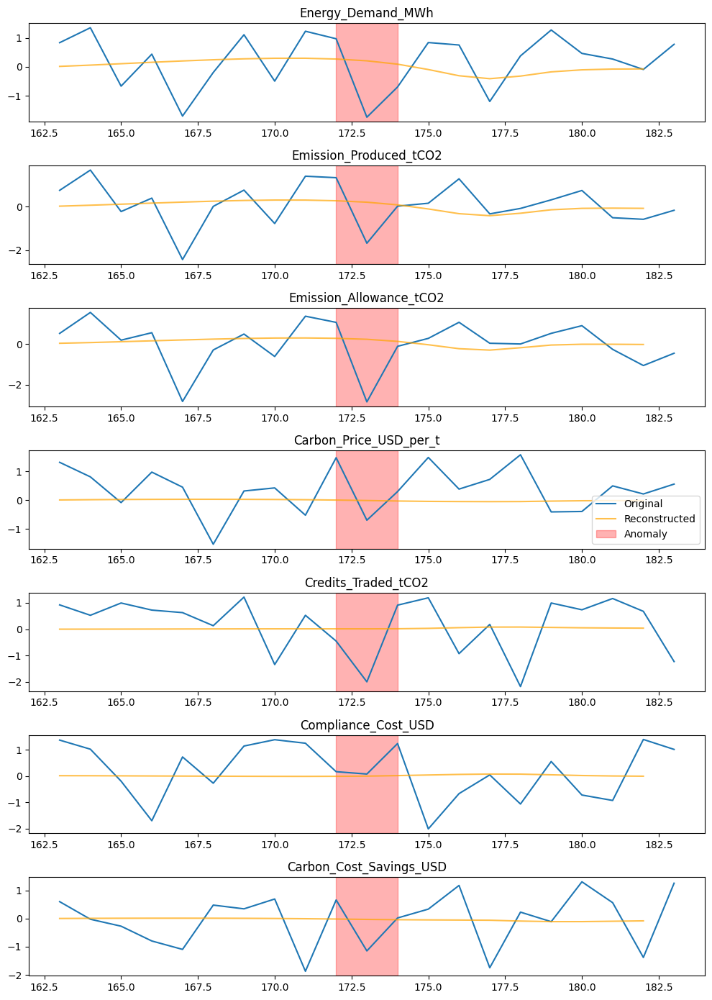

Anomaly window 586: plotting from 576 to 597


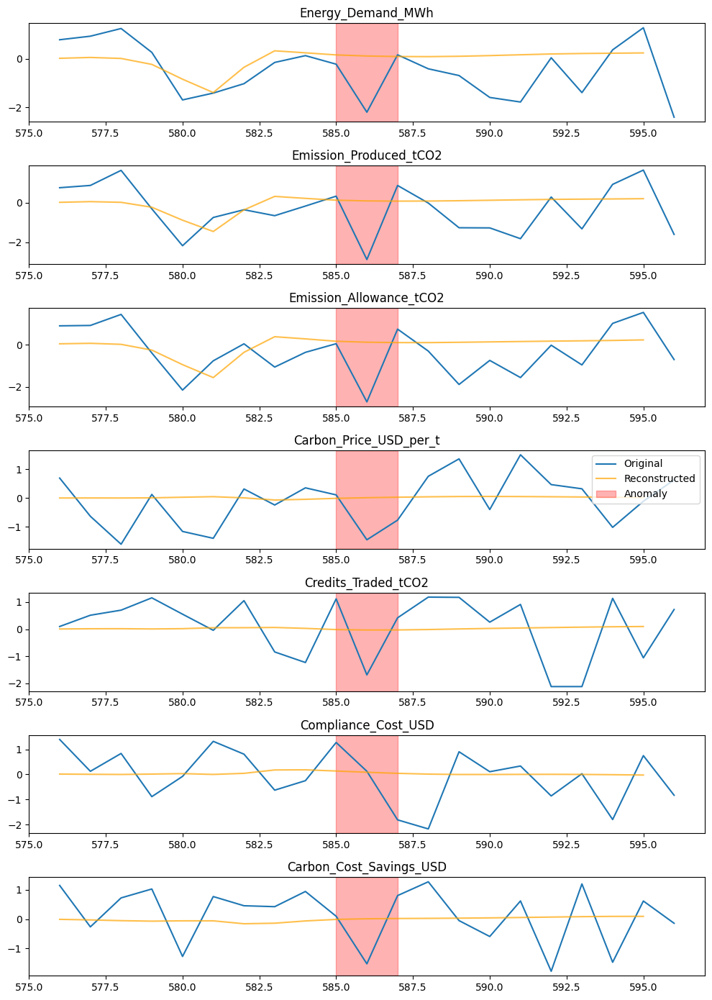

Anomaly window 636: plotting from 626 to 647


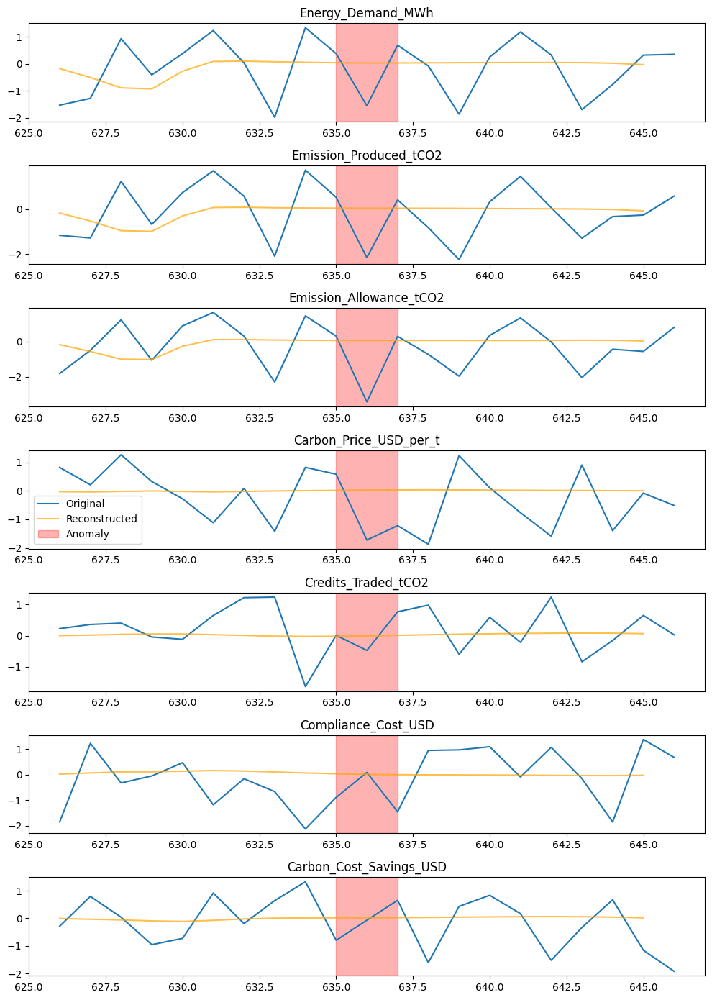

Anomaly window 928: plotting from 918 to 939


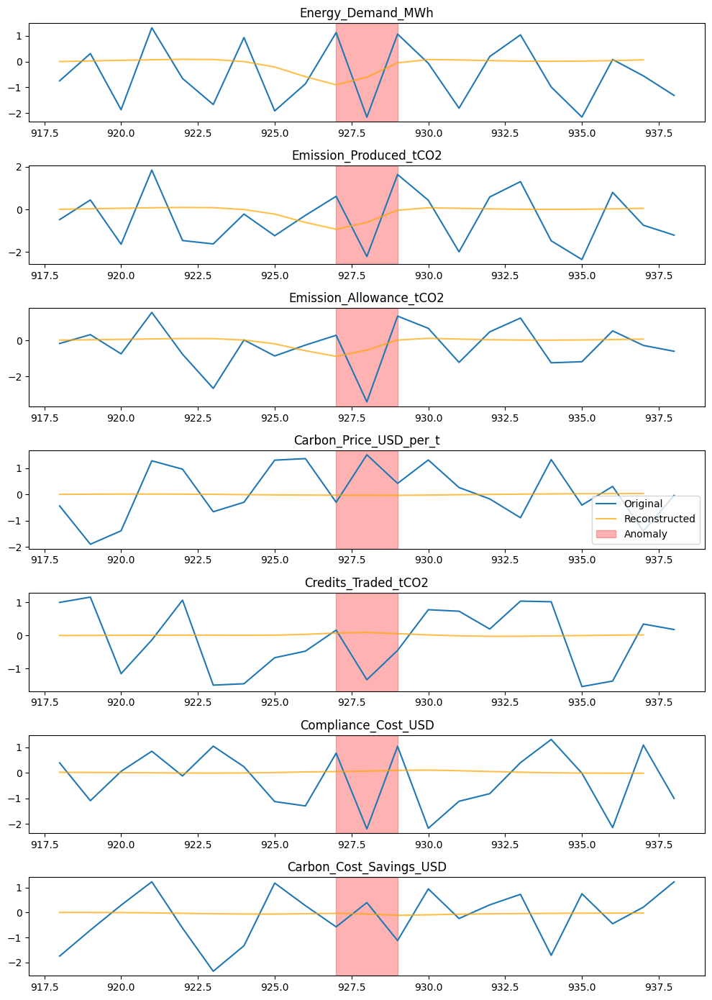

Anomaly window 1269: plotting from 1259 to 1280


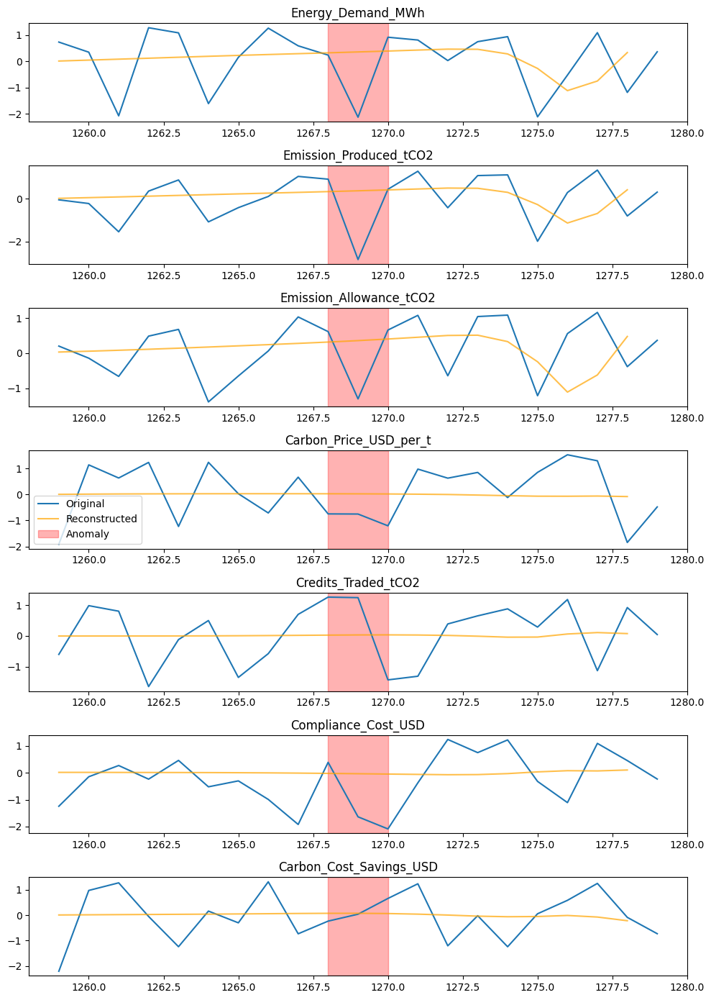

Anomaly window 1675: plotting from 1665 to 1686


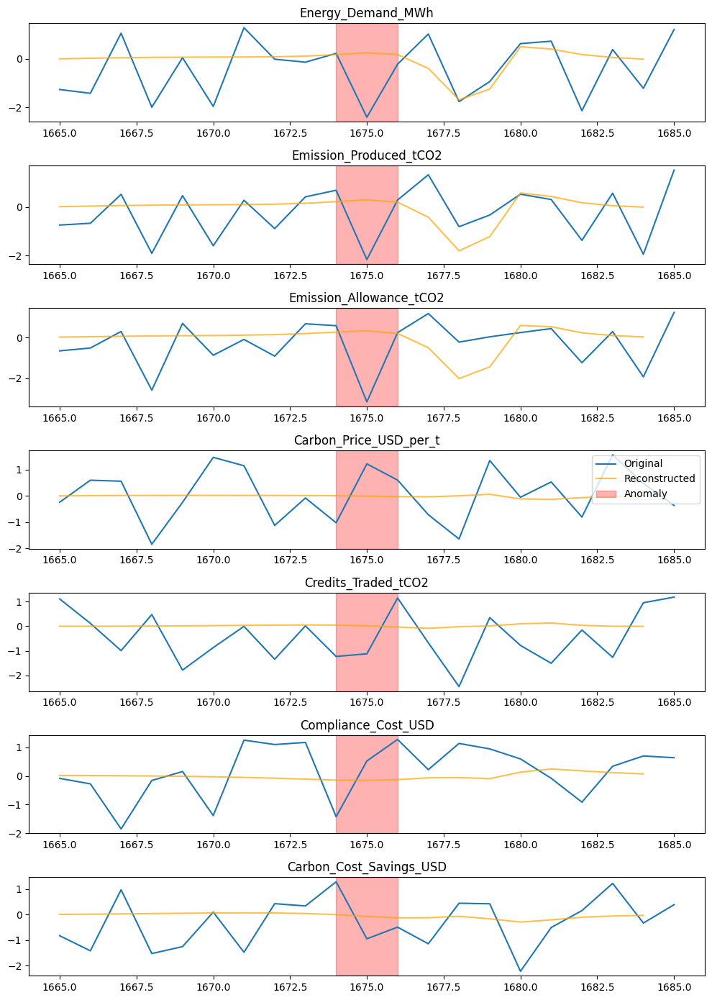

Anomaly window 1948: plotting from 1938 to 1959


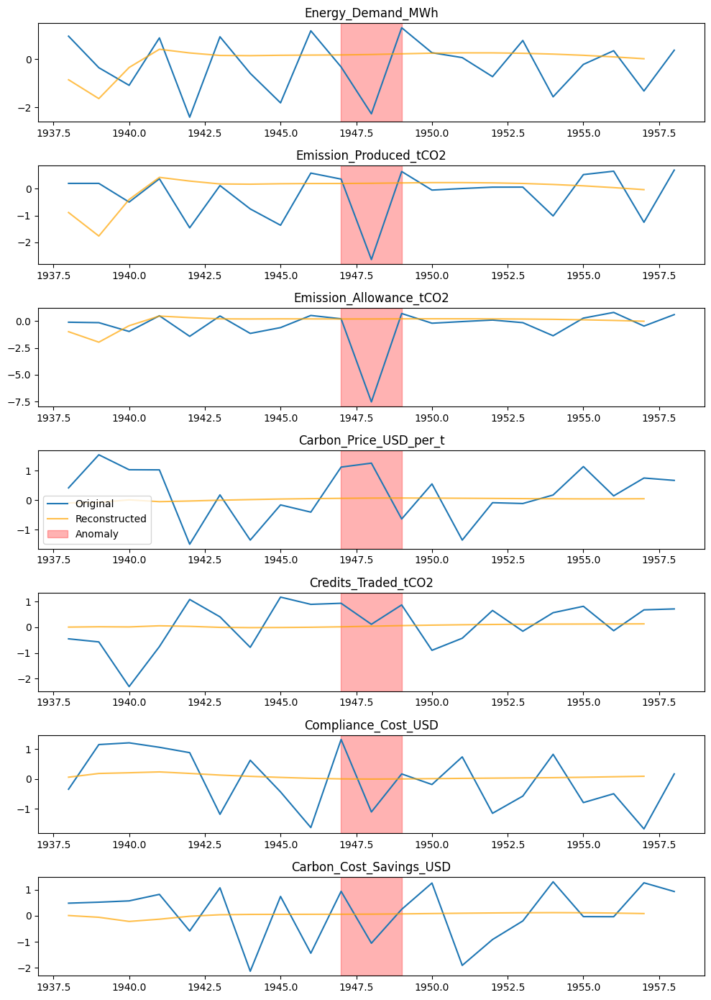

Anomaly window 1985: plotting from 1975 to 1996


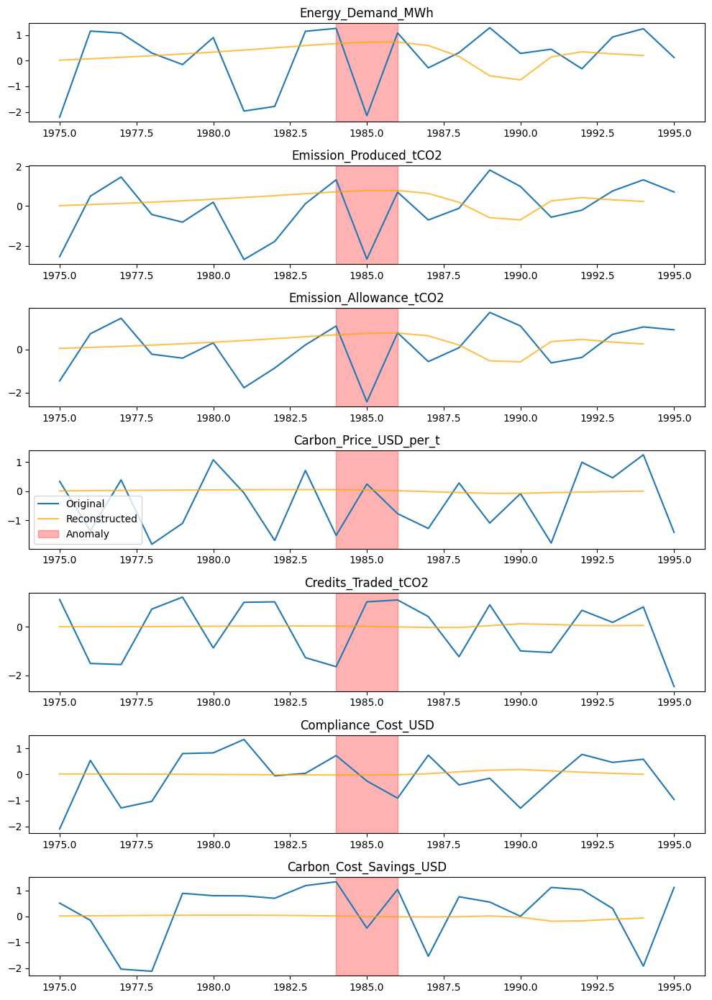

Anomaly window 2186: plotting from 2176 to 2197


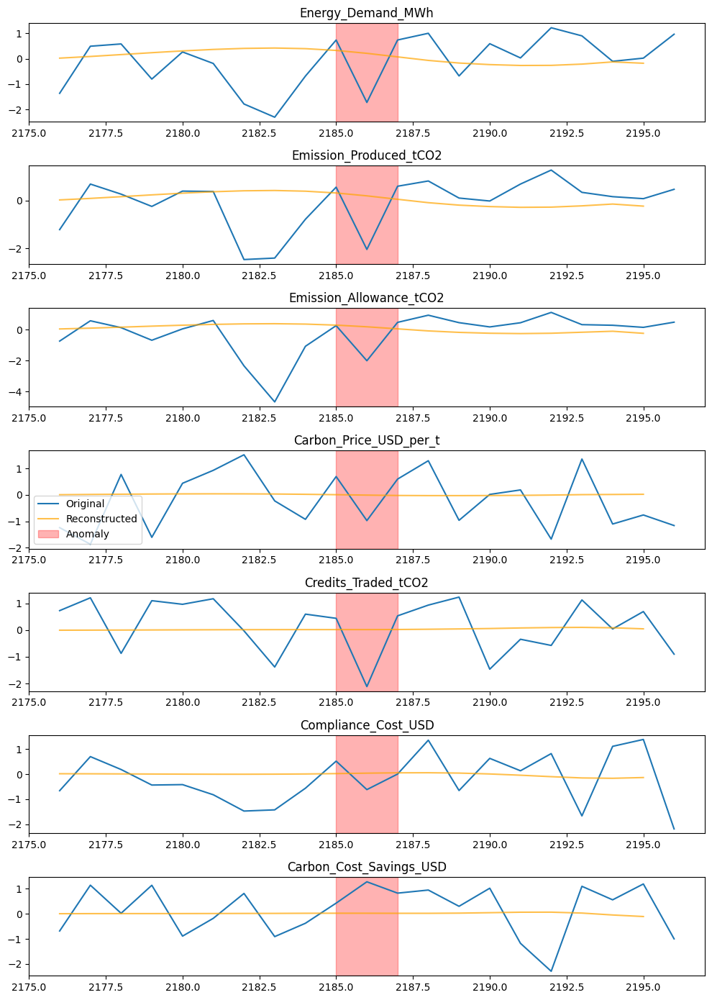

Anomaly window 2311: plotting from 2301 to 2322


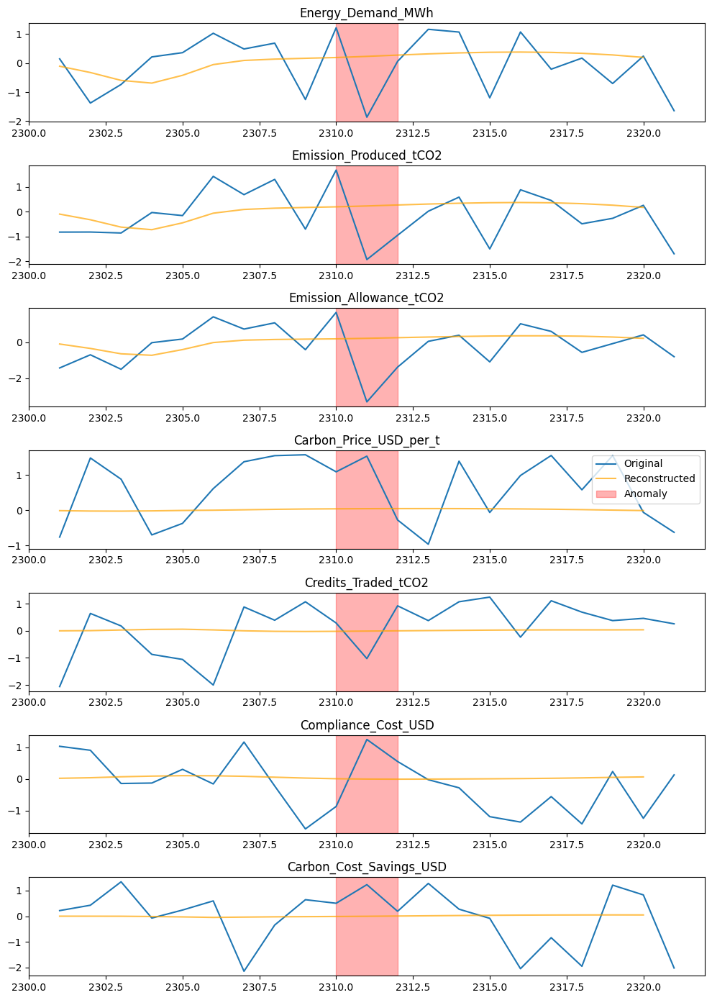

Anomaly window 2547: plotting from 2537 to 2558


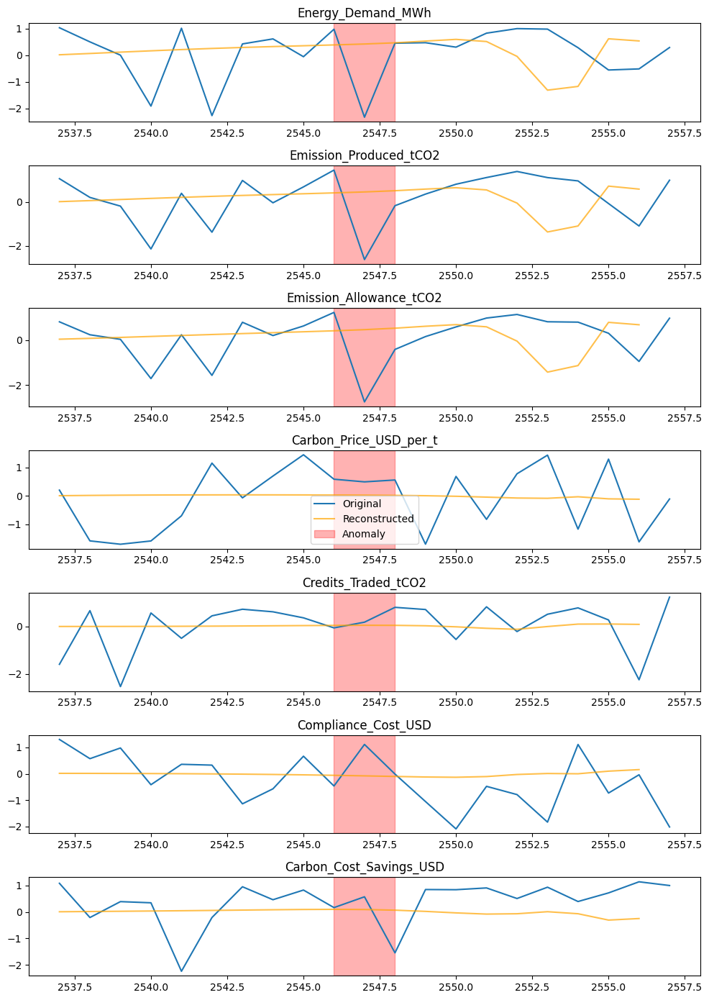

Anomaly window 2690: plotting from 2680 to 2701


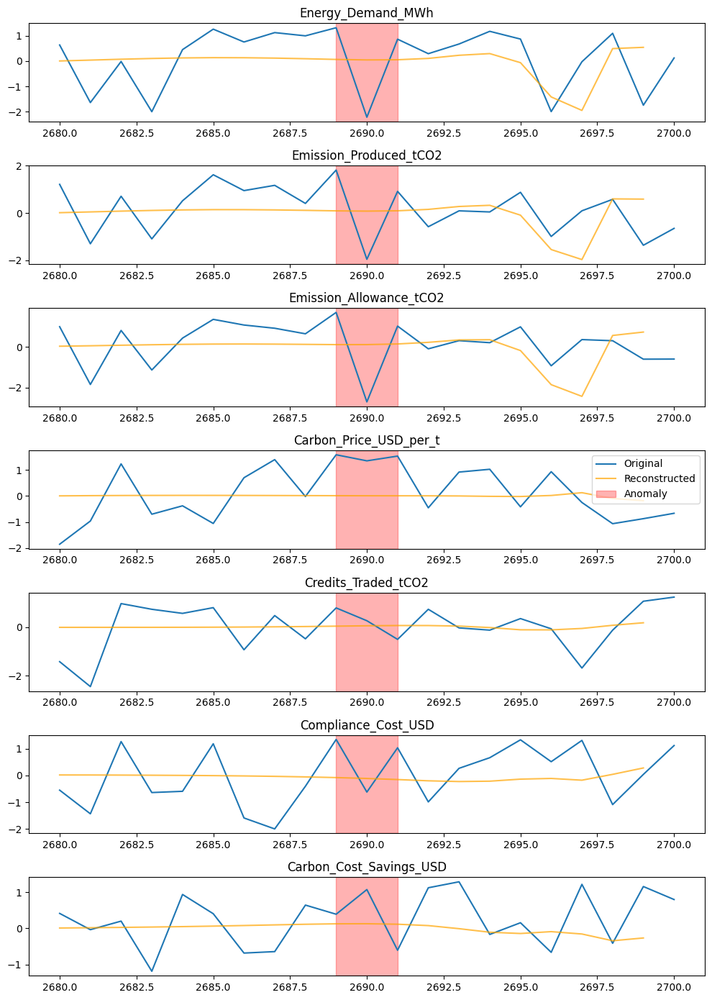

Anomaly window 2873: plotting from 2863 to 2884


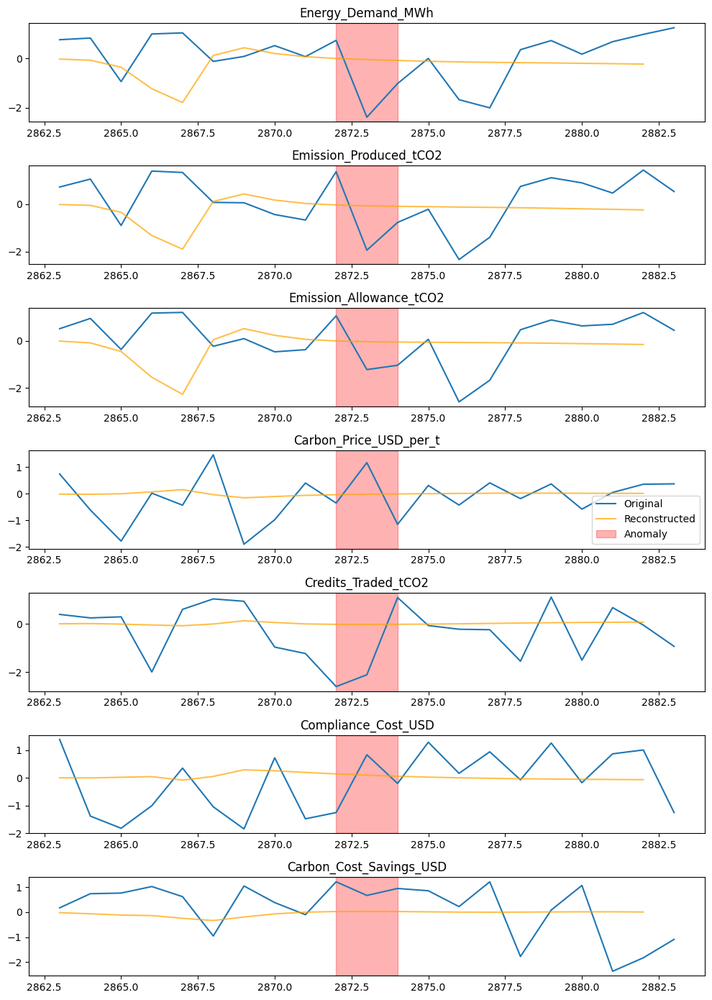

Anomaly window 2961: plotting from 2951 to 2972


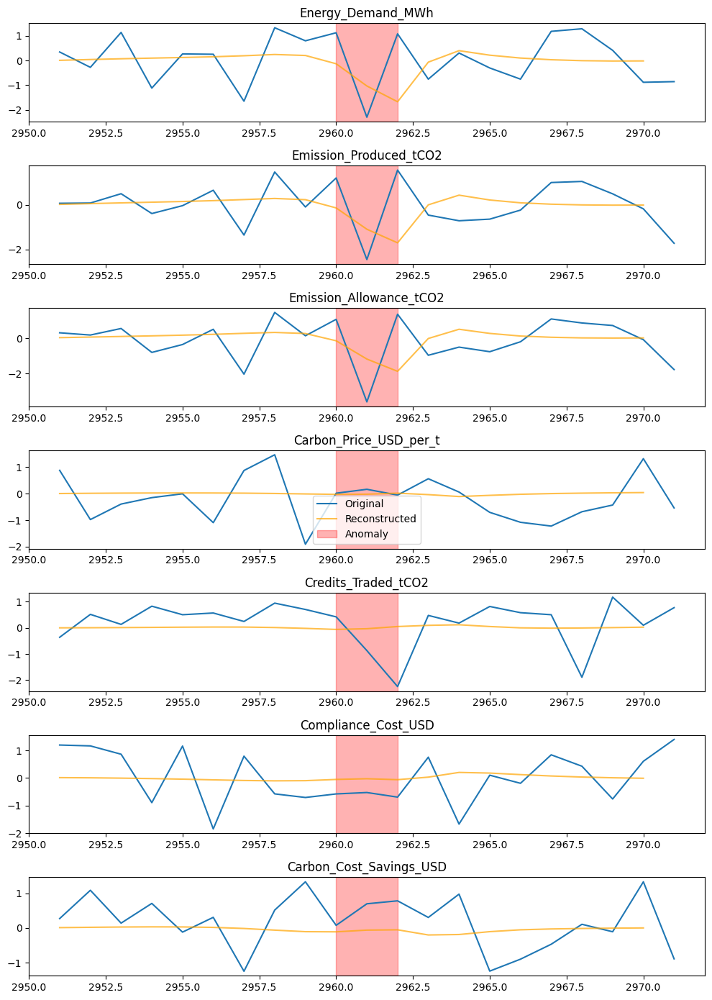

Anomaly window 2976: plotting from 2966 to 2987


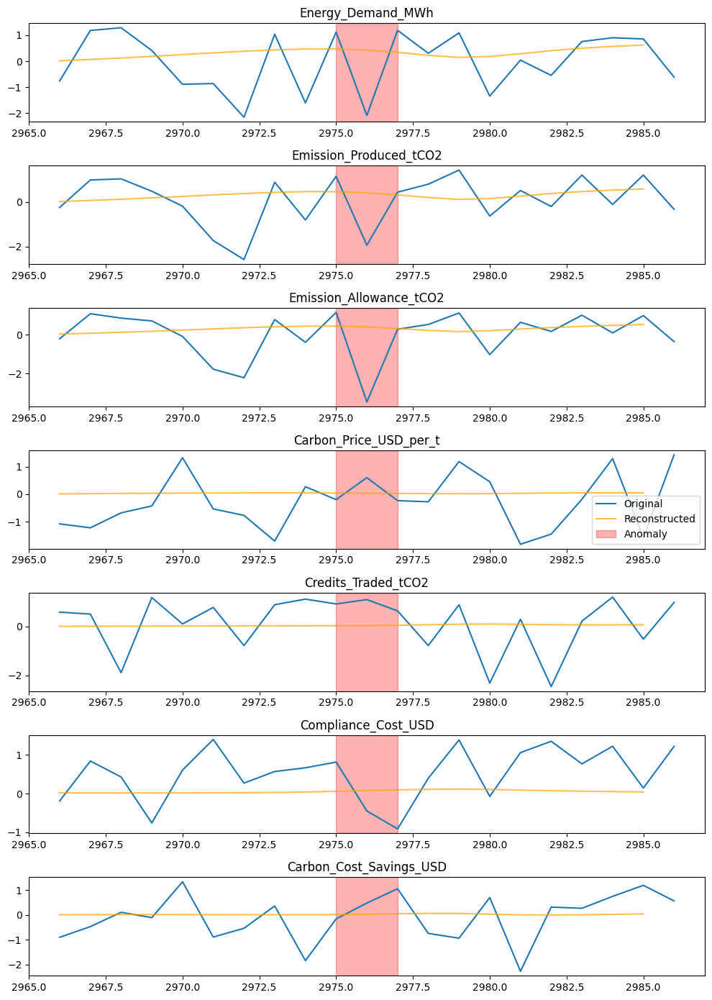

Anomaly window 3048: plotting from 3038 to 3059


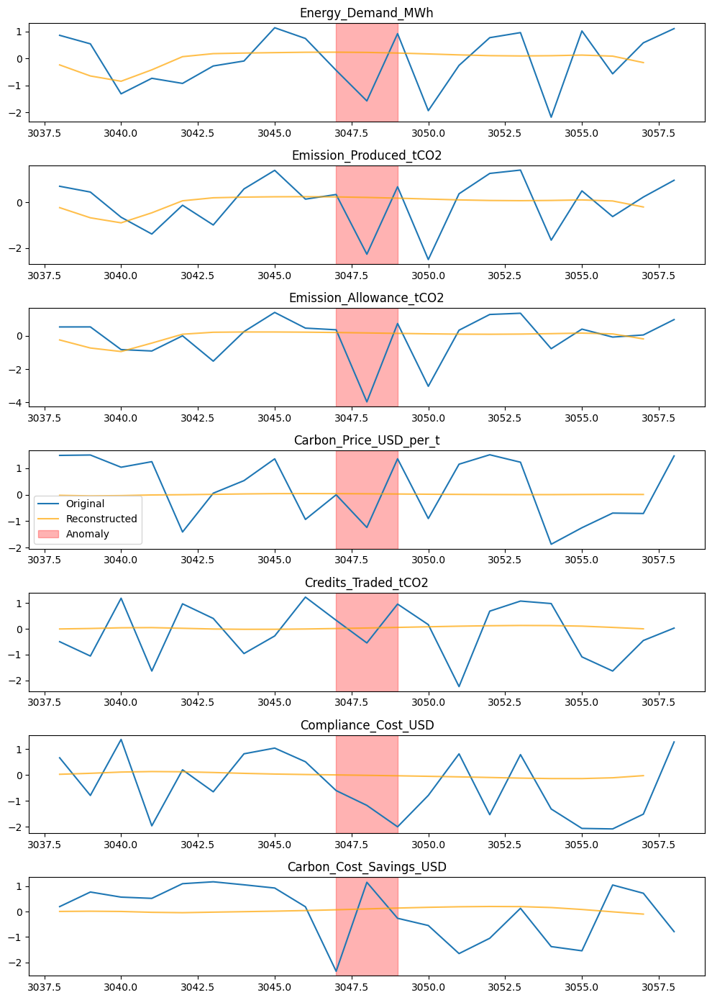

Anomaly window 3247: plotting from 3237 to 3258


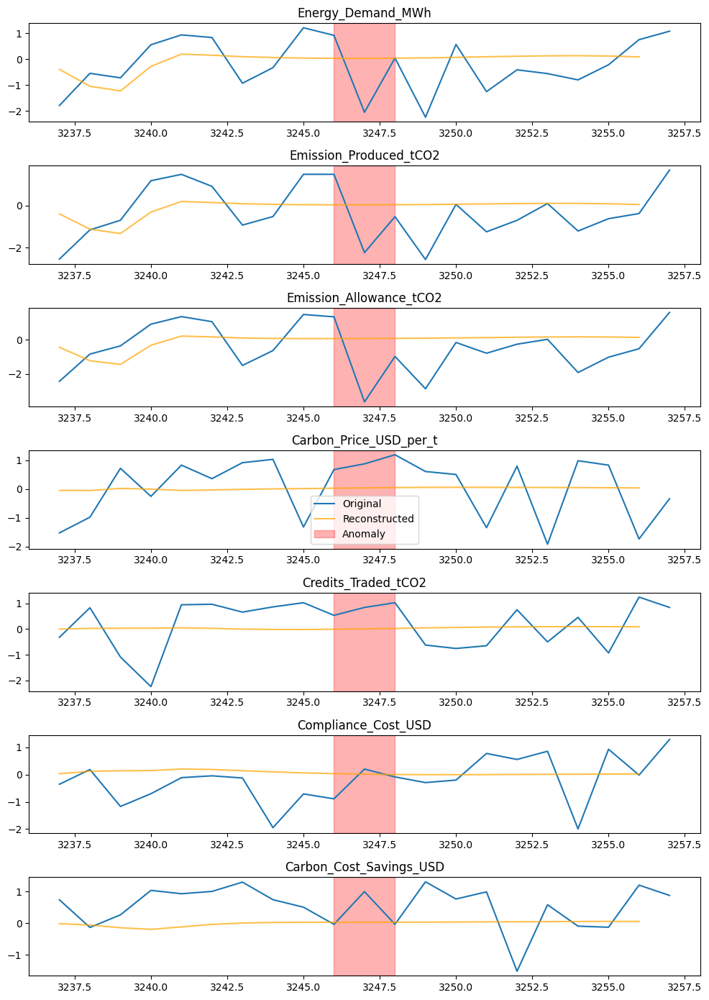

Anomaly window 3634: plotting from 3624 to 3645


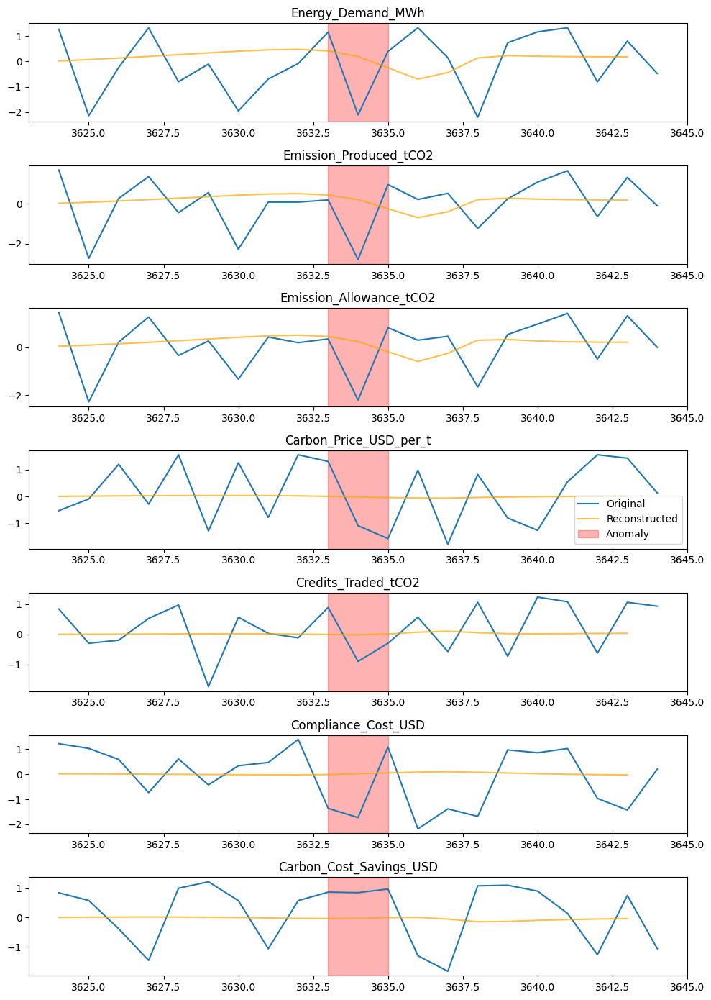

In [ ]:
# math mainly because of how my data is now in pairs of 30 and the function aggregate_window_errors deconstructs the error, but not the data
# so basically this now works

window_size = X_train.shape[1]  # 30

for idx in anomalous_train_points:
    anomaly_time = idx
    context = 10
    plot_start = max(0, anomaly_time - context)
    plot_end = anomaly_time + context + 1

    num_features = 7
    plt.figure(figsize=(10, 2*num_features))

    print(f"Anomaly window {idx}: plotting from {plot_start} to {plot_end}")

    # workaround to isolate anomalies for plotting
    for f in range(num_features):
        plt.subplot(num_features, 1, f+1)
        plt.plot(range(plot_start, plot_end), display_data_scaled.iloc[plot_start:plot_end, f], label='Original')

        # map to originals - inclusive exclusive
        recon_start = idx - context
        recon_end = idx + window_size - (2 * context)
        plt.plot(range(recon_start, recon_end), train_pred[idx, :, f][:20],
                 label='Reconstructed', alpha=0.7, color='orange')

        # red color
        plt.axvspan(anomaly_time - 1, anomaly_time + 1, color='red', alpha=0.3, label='Anomaly')
        plt.title(relevant_cols[f])
        if f == 3:
            plt.legend()

    plt.tight_layout()
    plt.show()

Anomaly window 4174: plotting from 4164 to 4185


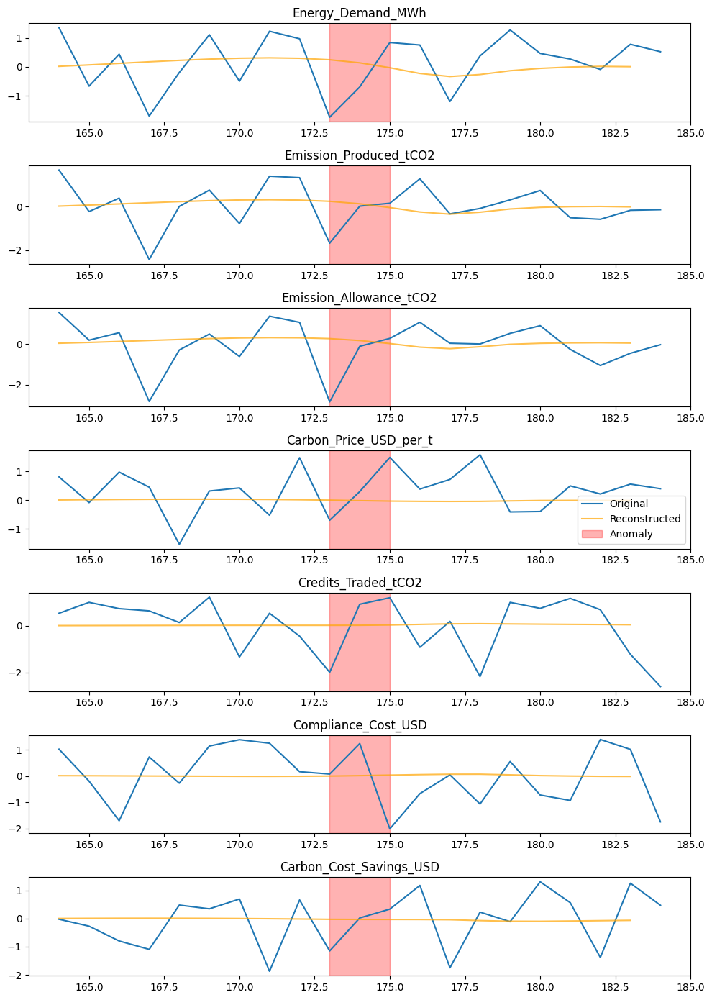

Anomaly window 4175: plotting from 4165 to 4186


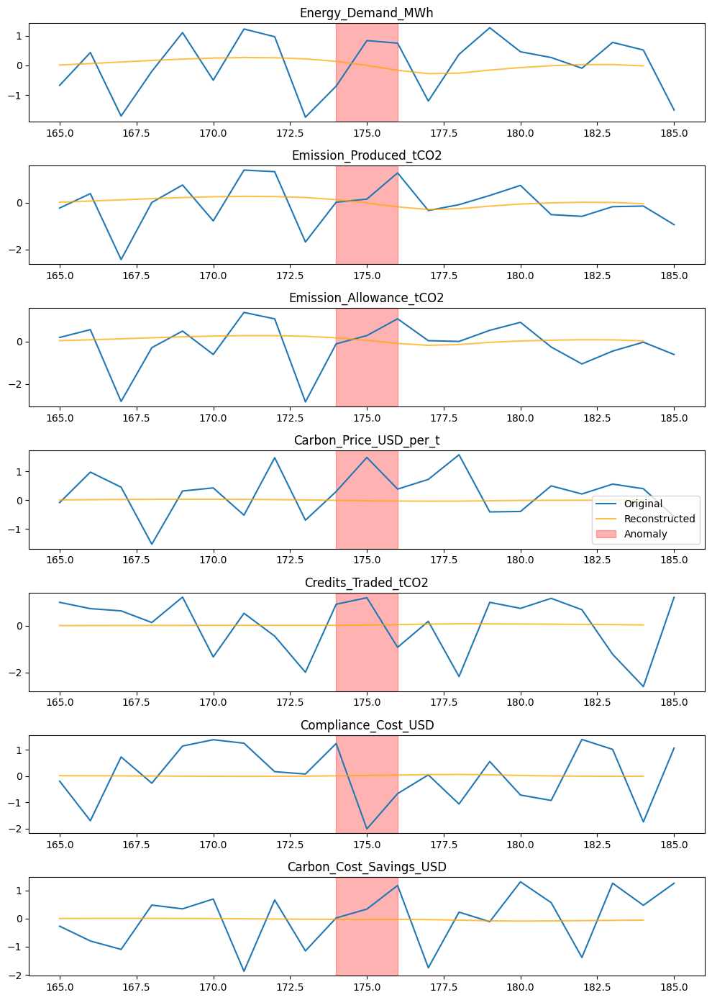

Anomaly window 4215: plotting from 4205 to 4226


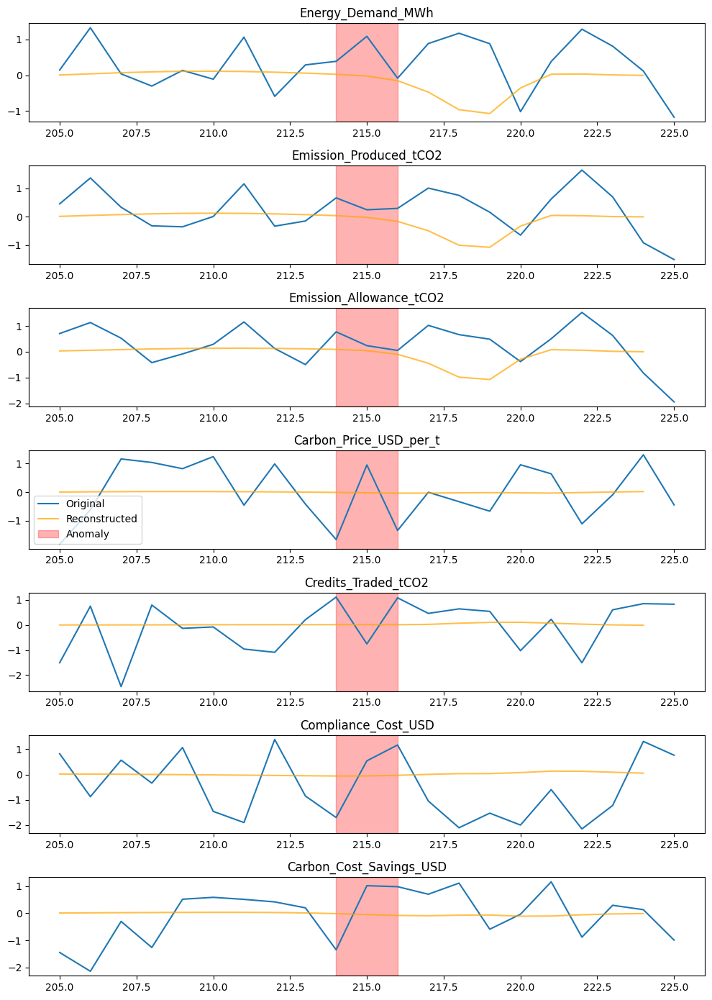

Anomaly window 4355: plotting from 4345 to 4366


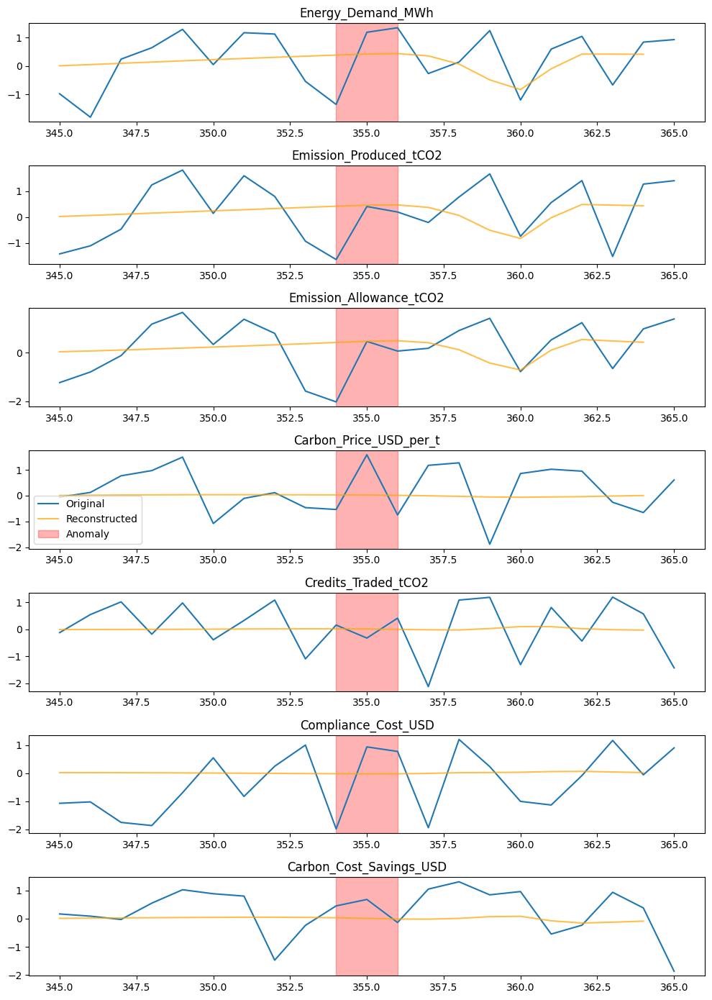

Anomaly window 4371: plotting from 4361 to 4382


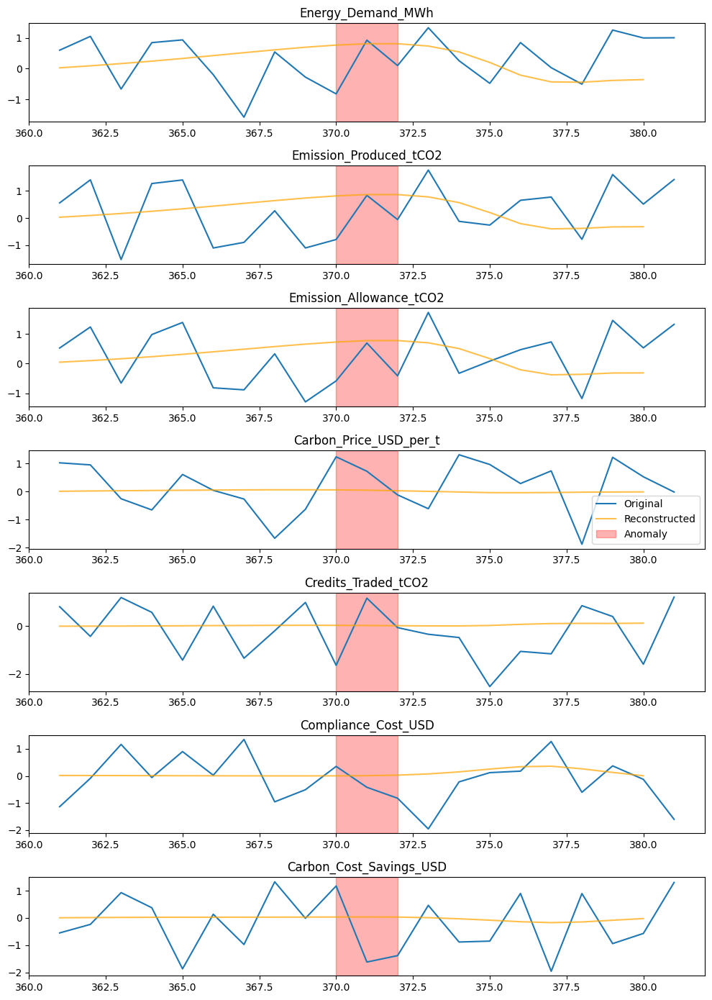

Anomaly window 4466: plotting from 4456 to 4477


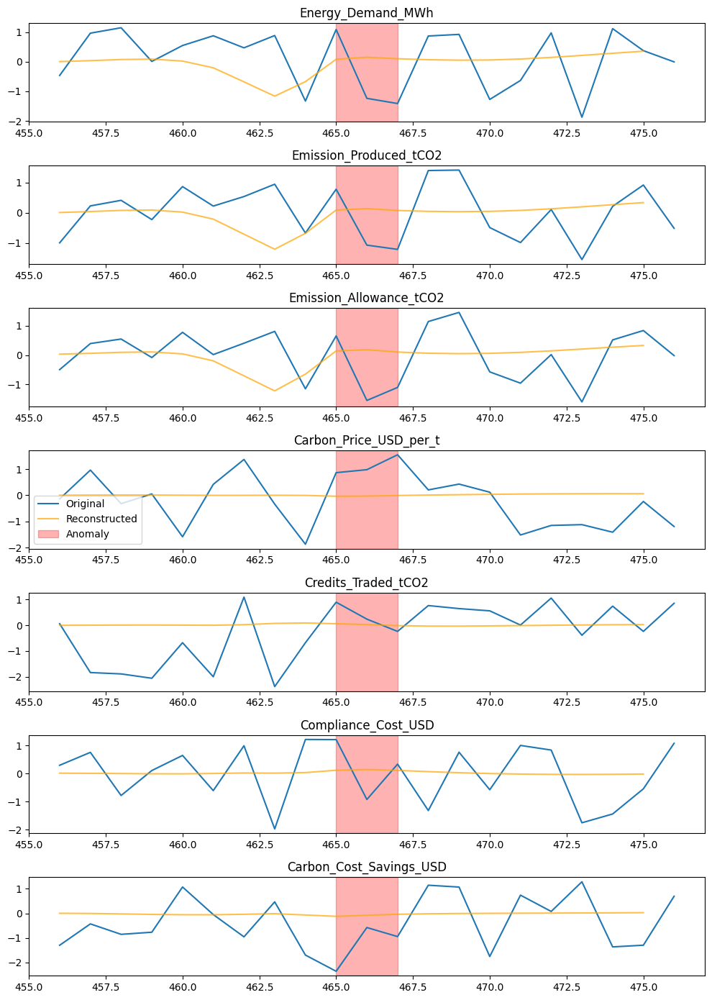

Anomaly window 4528: plotting from 4518 to 4539


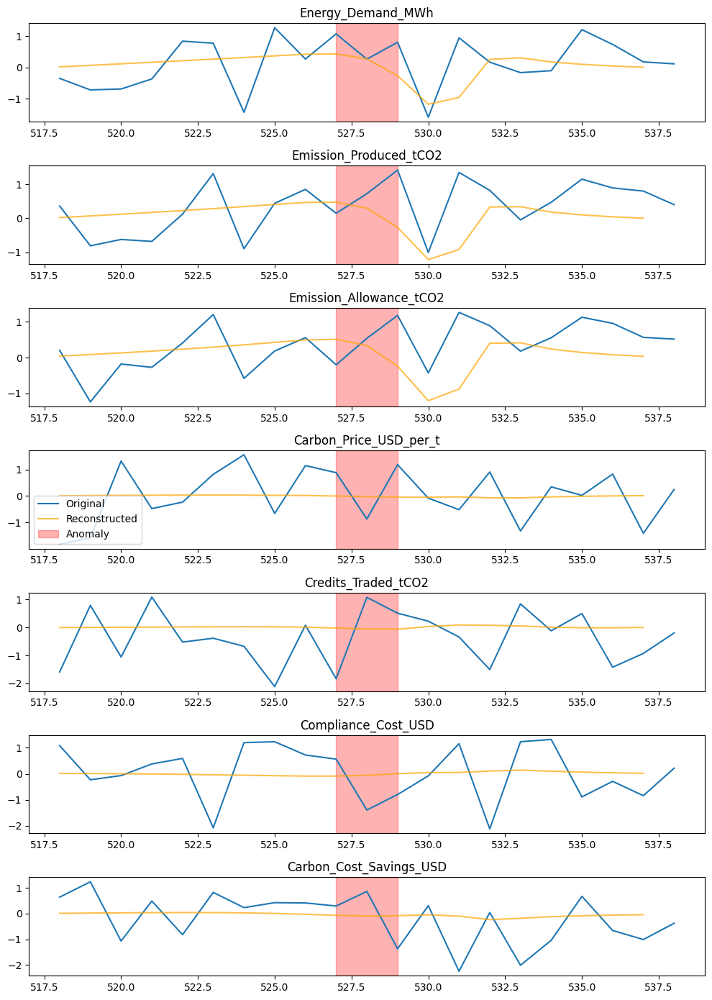

Anomaly window 4697: plotting from 4687 to 4708


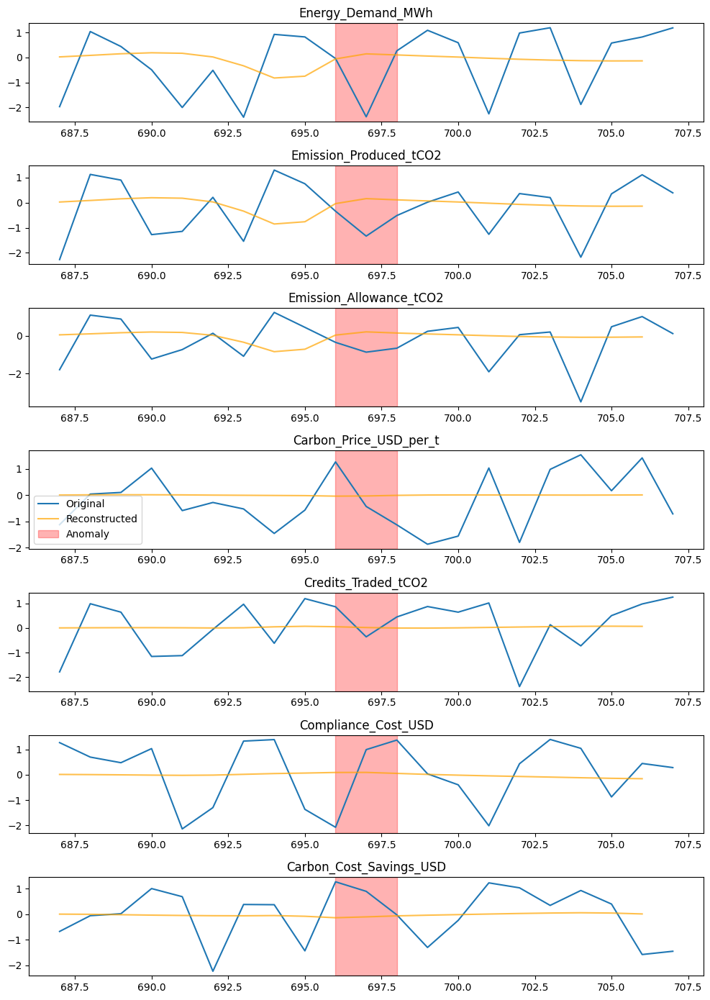

Anomaly window 4772: plotting from 4762 to 4783


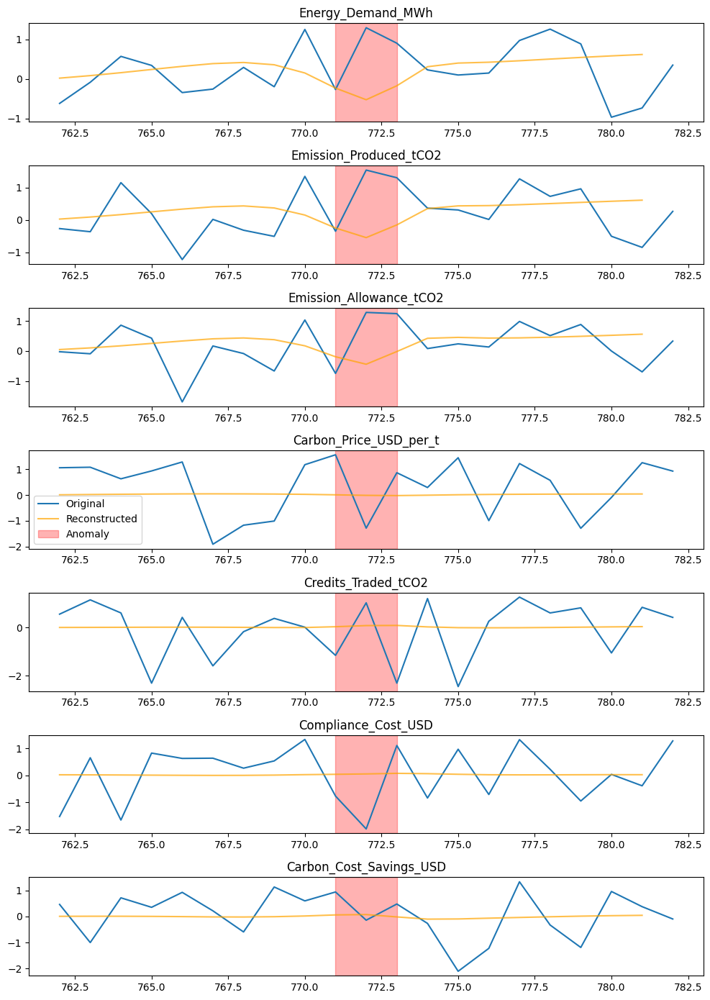

Anomaly window 4898: plotting from 4888 to 4909


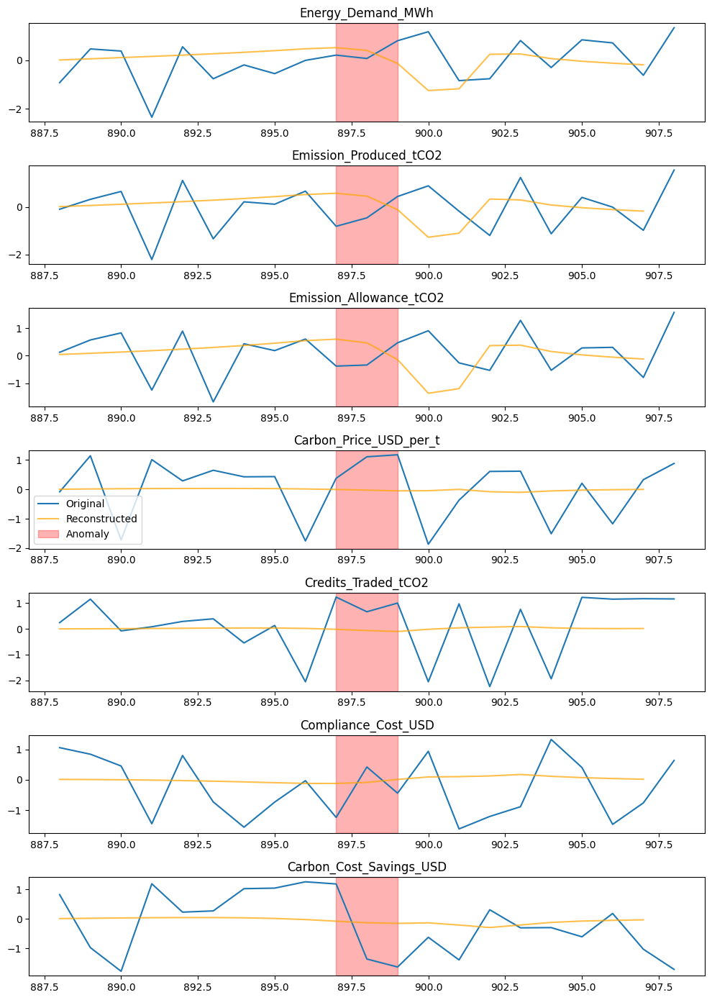

In [ ]:
# this is the same as above for test

window_size = X_test.shape[1]  # 30

for idx in anomalous_test_points:
    anomaly_time = idx
    context = 10
    plot_start = max(0, anomaly_time - context)
    plot_end = anomaly_time + context + 1

    num_features = 7
    plt.figure(figsize=(10, 2*num_features))

    print(f"Anomaly window {4000 + idx}: plotting from {4000+plot_start} to {4000+plot_end}")

    for f in range(num_features):
        plt.subplot(num_features, 1, f+1)
        plt.plot(range(plot_start, plot_end), display_data_scaled.iloc[plot_start:plot_end, f], label='Original')
        recon_start = idx - context
        recon_end = idx + window_size - (2 * context)
        plt.plot(range(recon_start, recon_end), train_pred[idx, :, f][:20],
                 label='Reconstructed', alpha=0.7, color='orange')
        plt.axvspan(anomaly_time - 1, anomaly_time + 1, color='red', alpha=0.3, label='Anomaly')
        plt.title(relevant_cols[f])
        if f == 3:
            plt.legend()

    plt.tight_layout()
    plt.show()

nov 9 - feature importance in the best model

In [ ]:
# the best model had:
# 'latent_dim': 16,
# 'l2_reg': 0.001,
# 'batch_size': 32,
# 'patience': 5
# train MSE: 0.89823

# build model
best_model = build_autoencoder(
    latent_dim=16,
    l2_reg=0.001,
    # dropout_rate=params['dropout_rate'],
)
es = EarlyStopping(monitor='val_loss', patience=5, restore_best_weights=True, verbose=1)

# train
history = model.fit(
    X[:4000], X[:4000],
    epochs = 40,
    batch_size=32,
    validation_split=0.2,
    callbacks=[es],
    verbose=0
)

val_loss = min(history.history['val_loss'])
print(f"Val loss: {val_loss:.6f}\n")


Epoch 20: early stopping
Restoring model weights from the end of the best epoch: 15.
Val loss: 0.928942



In [ ]:
X_pred = model.predict(X[:4000])

# averaging over samples and timesteps
feature_errors = np.mean(np.abs(X_pred - X[:4000]), axis=(0, 1))
feature_importance = feature_errors / np.sum(feature_errors)

cols = ["Energy_Demand_MWh", "Emission_Produced_tCO2", "Emission_Allowance_tCO2",
        "Carbon_Price_USD_per_t", "Credits_Traded_tCO2", "Compliance_Cost_USD", "Carbon_Cost_Savings_USD"]

importance_df = pd.DataFrame({
    'Feature': cols,
    'Importance': feature_importance
}).sort_values('Importance', ascending=False)

importance_df

125/125 ━━━━━━━━━━━━━━━━━━━━ 2s 16ms/step


,Feature,Importance
3,Carbon_Price_USD_per_t,0.151101
5,Compliance_Cost_USD,0.147176
6,Carbon_Cost_Savings_USD,0.146857
4,Credits_Traded_tCO2,0.145558
0,Energy_Demand_MWh,0.140759
1,Emission_Produced_tCO2,0.138142
2,Emission_Allowance_tCO2,0.130407


parallel coordinates from COS IW02 seminar lecture today

125/125 ━━━━━━━━━━━━━━━━━━━━ 3s 23ms/step
(4000, 7)
parallel coordinates with 100


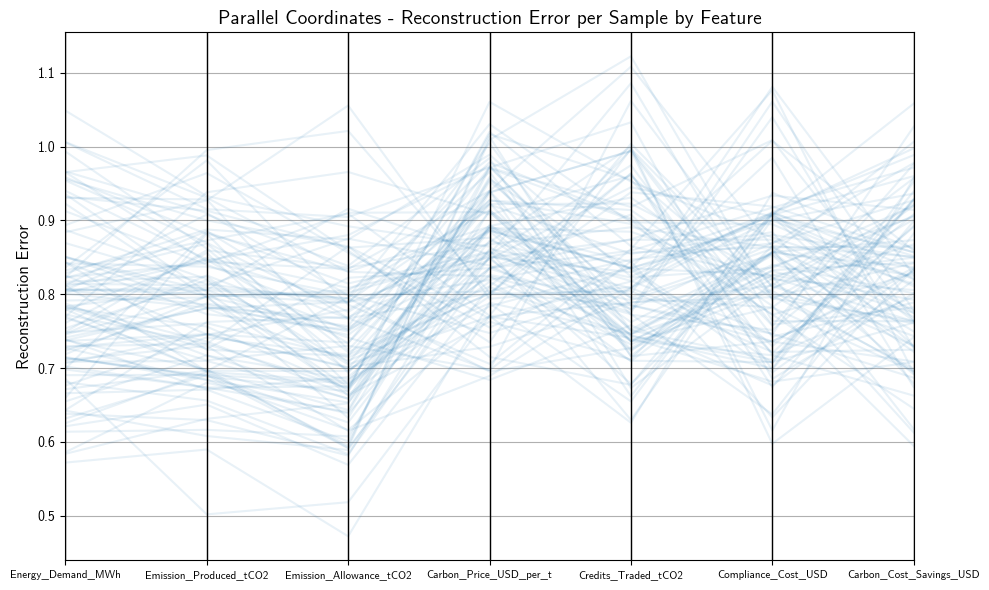

parallel coordinates with 1000


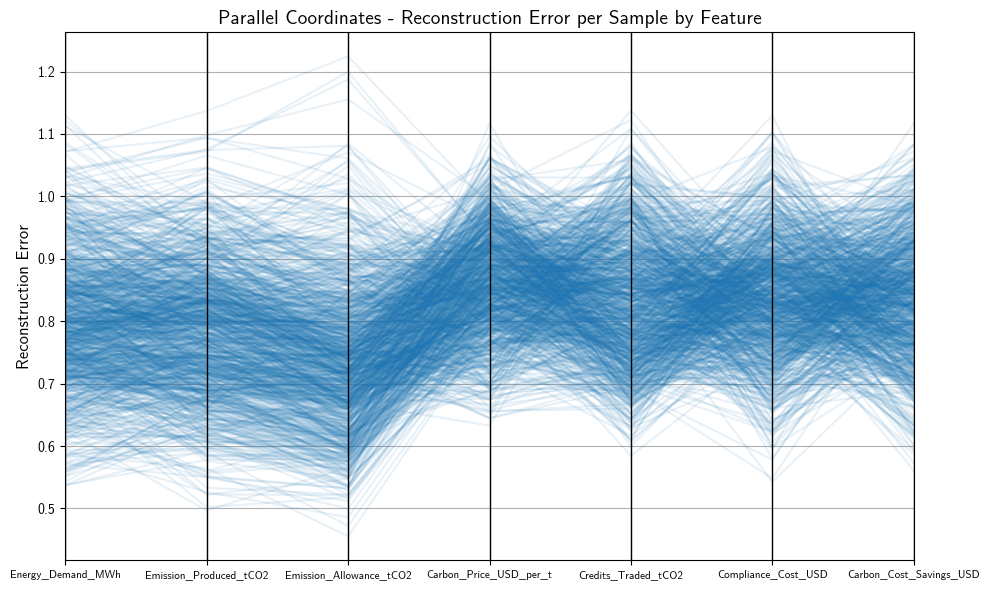

In [ ]:
import matplotlib.pyplot as plt
import matplotlib.font_manager as fm
import pandas as pd
import numpy as np
from pandas.plotting import parallel_coordinates

# predict
X_pred = model.predict(X[:4000])
sample_feature_errors = np.mean(np.abs(X_pred - X[:4000]), axis=1)
print(sample_feature_errors.shape)

# each of the columns
cols = [
    "Energy_Demand_MWh",
    "Emission_Produced_tCO2",
    "Emission_Allowance_tCO2",
    "Carbon_Price_USD_per_t",
    "Credits_Traded_tCO2",
    "Compliance_Cost_USD",
    "Carbon_Cost_Savings_USD"
]

# font
plt.rcParams["text.usetex"] = False
font_path = "/content/lmsans10-regular.otf"
fm.fontManager.addfont(font_path)
plt.rcParams["font.family"] = "Latin Modern Sans"


df_errors = pd.DataFrame(sample_feature_errors, columns=cols)
df_errors['Sample'] = np.arange(len(df_errors))

# try for 100 parallel coordinates
print('parallel coordinates with 100')
subset = df_errors.sample(100, random_state=42).copy()
plt.figure(figsize=(10,6))
parallel_coordinates(subset, 'Sample', color=['#1f77b4'], alpha=0.1)

plt.title("Parallel Coordinates - Reconstruction Error per Sample by Feature", fontsize=14)
plt.ylabel("Reconstruction Error", fontsize=12)
plt.xticks(rotation=0, fontsize=8)   # smaller x-axis labels
plt.yticks(fontsize=10)
plt.legend([], [], frameon=False)     # hide legend
plt.tight_layout()
plt.show()

# try 1000 better looking for density
print('parallel coordinates with 1000')
subset = df_errors.sample(1000, random_state=42).copy()

# more plot
plt.figure(figsize=(10,6))
parallel_coordinates(subset, 'Sample', color=['#1f77b4'], alpha=0.1)

plt.title("Parallel Coordinates - Reconstruction Error per Sample by Feature", fontsize=14)
plt.ylabel("Reconstruction Error", fontsize=12)
plt.xticks(rotation=0, fontsize=8)   # smaller x-axis labels
plt.yticks(fontsize=10)
plt.legend([], [], frameon=False)     # hide legend
plt.tight_layout()
plt.show()